## Notebook de visualisation des données 
- Visualisation des signaux EEG bruts en fonction du temps avec différents filtrages
- Visualisation des premières composantes ICA et CSP 
    - Visualisation des signaux EEG après avoir retirer / ou garder certaines de ces composantes
- Visualisation des évènements : Flexion / Extension
- Visualisation des époques : On affiche les plots des époques en fonction du temps avec en couleur l'intensité des EEG. (A faire avec un axe des abscisses fréquentiel ? )


L'idée c'est aussi de comparer les données du patient 4 qui a des bonnes caractéristiques vis à vis du mouvement avec des données d'autres patients 




In [2]:
""" Listes des différentes electrodes dont on aura besoin """

electrodes_R = [
     'Fz', 'F2', 'F4', 'F6', 'F8',
    'FCz','FC2','FC4','FC6','FT8', 
     'Cz', 'C2', 'C4', 'C6', 'T8',
    'CPz','CP2','CP4','CP6','TP8',
     'Pz', 'P2', 'P4', 'P6', 'P8',
]

electrodes_L = [
     'Fz', 'F1', 'F3', 'F5', 'F7',
    'FCz','FC1','FC3','FC5','FT7', 
     'Cz', 'C1', 'C3', 'C5', 'T7',
    'CPz','CP1','CP3','CP5','TP7',
     'Pz', 'P1', 'P3', 'P5', 'P7',
]

motor_electrods_d = ['FC2', 'FC4', 'FC6', 
                         'C2', 'C4', 'C6',
                         'CP2', 'CP4', 'CP6']

motor_electrods_g = ['FC1', 'FC3', 'FC5',
                          'C1', 'C3', 'C5',
                          'CP1', 'CP3', 'CP5']

In [104]:
len(electrodes_L)

25

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import mne

from preprocessing.data_loader import DataLoader
from scipy import signal
from scipy.fft import fft, ifft, fftfreq
from sklearn.decomposition import PCA

In [4]:
"""
Patients intéressants: 004, 102
"""

'\nPatients intéressants: 004, 102\n'

In [5]:
FILE_PATH_TRIAL = '../../data/raw/Data_npy/DATA_004_Trial1.npy'
loader_trial = DataLoader(FILE_PATH_TRIAL)
side_of_motor_arm = "G"
raw_g = loader_trial.get_raws(side = side_of_motor_arm)
raw_d = loader_trial.get_raws(side = 'D')

In [6]:
# 1er Filtrage
raw_g.filter(l_freq =1,h_freq = 60)
raw_d.filter(l_freq =1,h_freq = 60)

<RawArray | 70 x 229827 (224.4 s), ~122.8 MB, data loaded>

# ICA Analysis

In [8]:

ica_g = mne.preprocessing.ICA(n_components = 20, random_state = 0)
# ica_g.fit(raw_g.copy())
ica_g.fit(raw_g.copy().filter(1,20))

ica_g_2 = mne.preprocessing.ICA(n_components = 20, random_state = 0)
ica_g_2.fit(raw_g.copy().filter(20, 40))

ica_g_3 = mne.preprocessing.ICA(n_components = 20, random_state = 0)
ica_g_3.fit(raw_g.copy().filter(10, 30))

ica_d = mne.preprocessing.ICA(n_components = 20, random_state = 0)
ica_d.fit(raw_d.copy())

Method,fastica
Fit,63 iterations on raw data (229827 samples)
ICA components,20
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


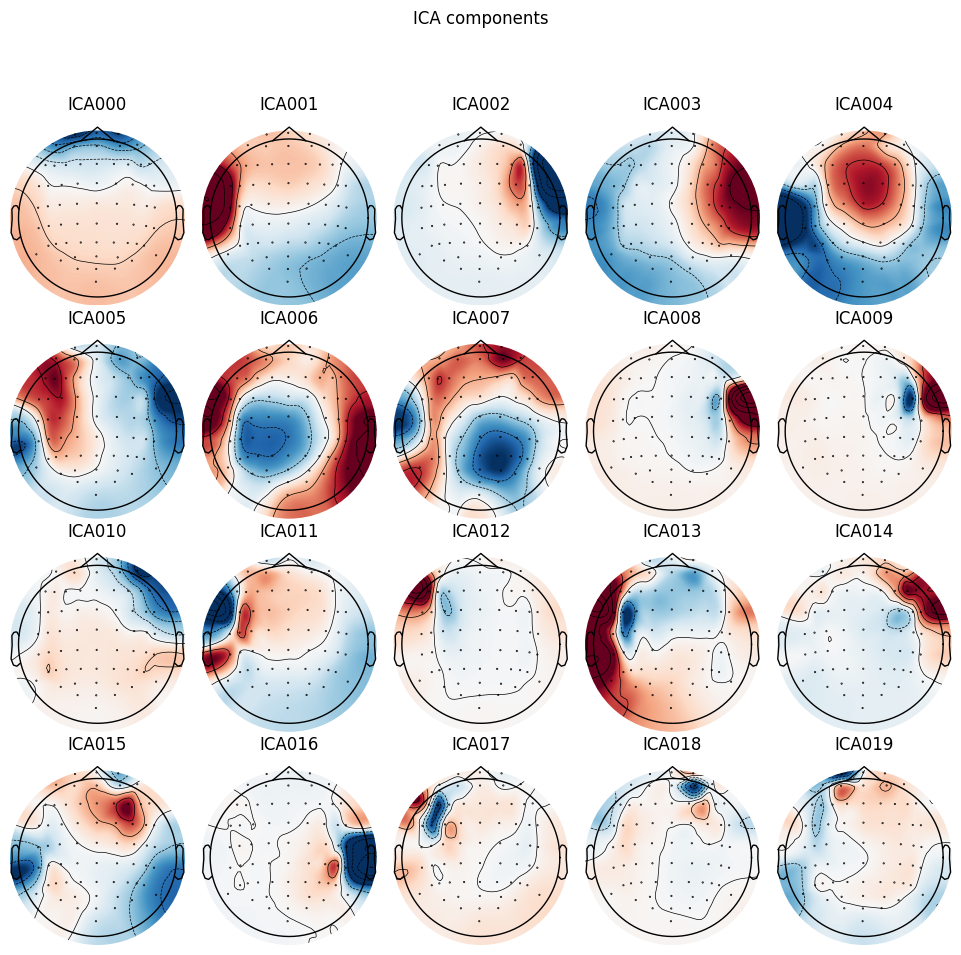

In [9]:
ica_g.plot_components();

In [13]:
# On exclut les composantes qui sont potentiellement dues aux clignements des yeux
def return_exclude(include, nbr_components=20):
    exclude  = list(set(list(range(0,nbr_components))).difference(set(include)))
    return exclude


ica_g.exclude = [0]
# ica.exclude = list(range(15))
# raw_g = ica_g.apply(raw_g.copy(),exclude=ica_g.exclude)

In [19]:
ica_g.apply(raw_g.copy(),exclude=return_exclude([4]))

<RawArray | 70 x 245609 (239.9 s), ~131.2 MB, data loaded>

# On récupère les évènements Flexion & Extension

19 events found
Event IDs: [1 2]
19 events found
Event IDs: [1 2]


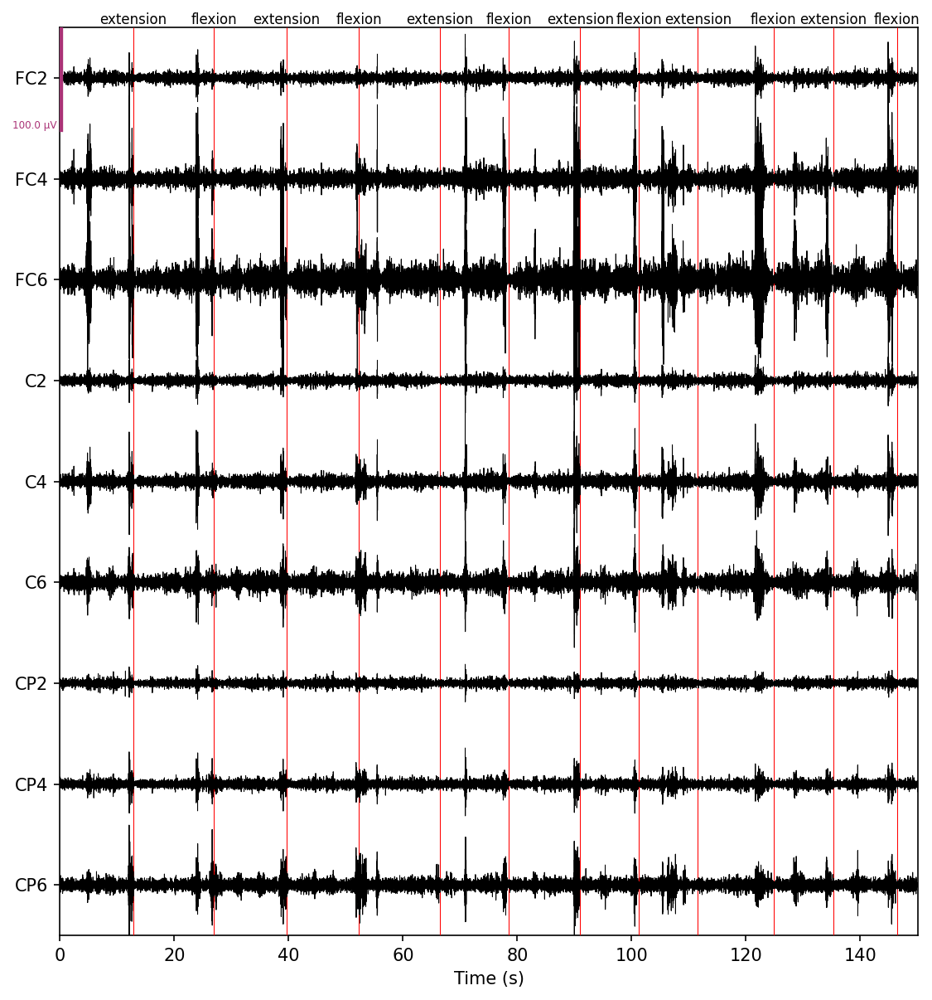

In [10]:
from mne import find_events

events_g = find_events(raw_g, stim_channel="movement",shortest_event=0, verbose=True)
events_d = find_events(raw_d, stim_channel="movement",shortest_event=0, verbose=True)
event_ids = dict(extension = 1, flexion = 2)
event_colors = dict(red = 1, blue = 2, green=0)
scal = dict(eeg = 5e-5)   

plt.rcParams['figure.dpi'] = 150

raw_g.copy().pick(motor_electrods_d).plot(
           events=events_g, 
           event_color="red", 
           event_id=event_ids,
           scalings= dict(eeg = 5e-5) ,
           clipping=None, 
            show_scrollbars=False,
            show_scalebars=True, 
           start=0,       # EDIT ME!ço
           duration=150,   
           lowpass=40, highpass=10,  # EDIT ME!
           n_channels=10,
           title="Les différentes électrodes avec les débuts de chaque mouvement")   # EDIT ME!

plt.show()

In [ ]:

ica_g.apply(raw_g.copy(),exclude=return_exclude([2,7,15])).plot(events=events_g, 
           event_color="red", 
           event_id=event_ids,
           scalings= dict(eeg = 5e-5) ,
           clipping=None, 
            show_scrollbars=False,
            show_scalebars=True, 
           start=0,       # EDIT ME!
           duration=150,   
           lowpass=40, highpass=10,  # EDIT ME!
           n_channels=10,
           title="Les différentes électrodes avec les débuts de chaque mouvement")   # EDIT ME!


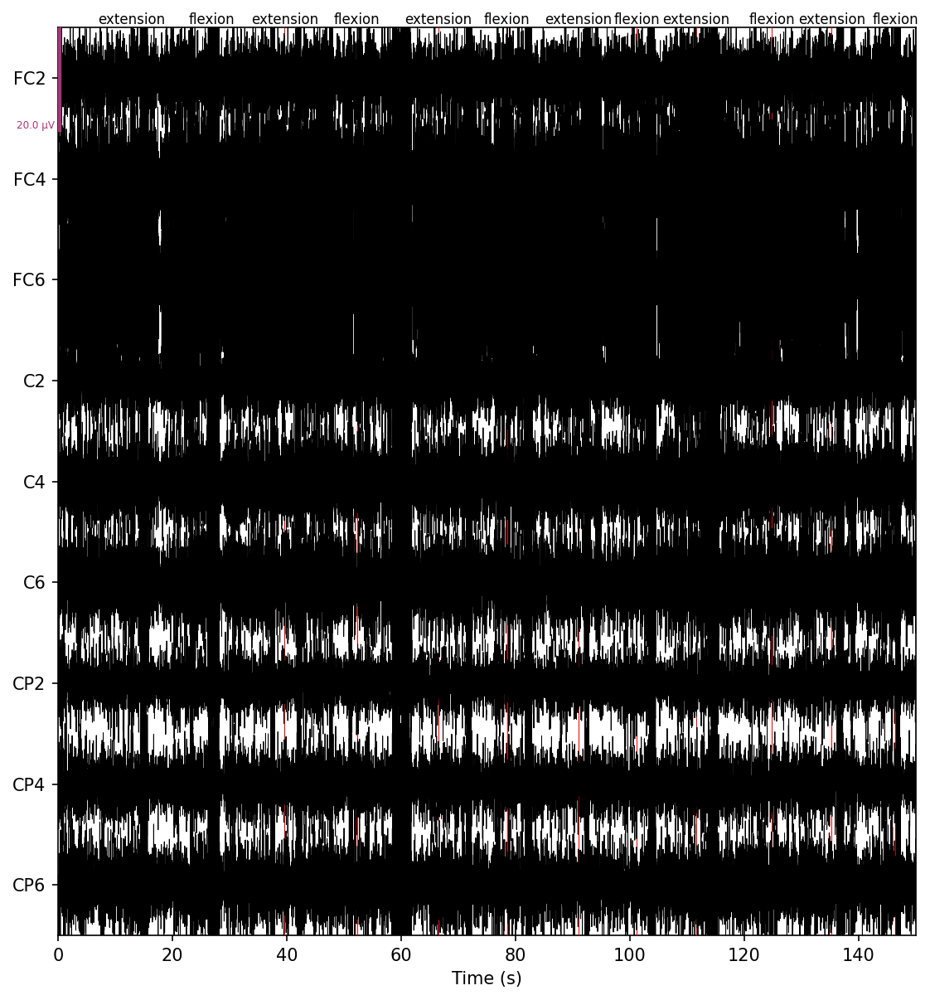

In [51]:
# Même chose mais en enlevant certaines composantes de la ICA
# sensées correspondre aux clignements des yeux 
scal = dict(eeg = 1e-5) 
plt.rcParams['figure.dpi'] = 150
raw_d.copy().pick(motor_electrods_d).plot(
        events=events_g, 
        event_color="red", 
        event_id=event_ids,
        scalings= scal,
        clipping=None, show_scrollbars=False, show_scalebars=True, 
        start=0,       # EDIT ME!ço
        duration=150,   
        lowpass=40, 
        highpass=1,  # EDIT ME!
        n_channels=10)   # EDIT ME!
plt.show()

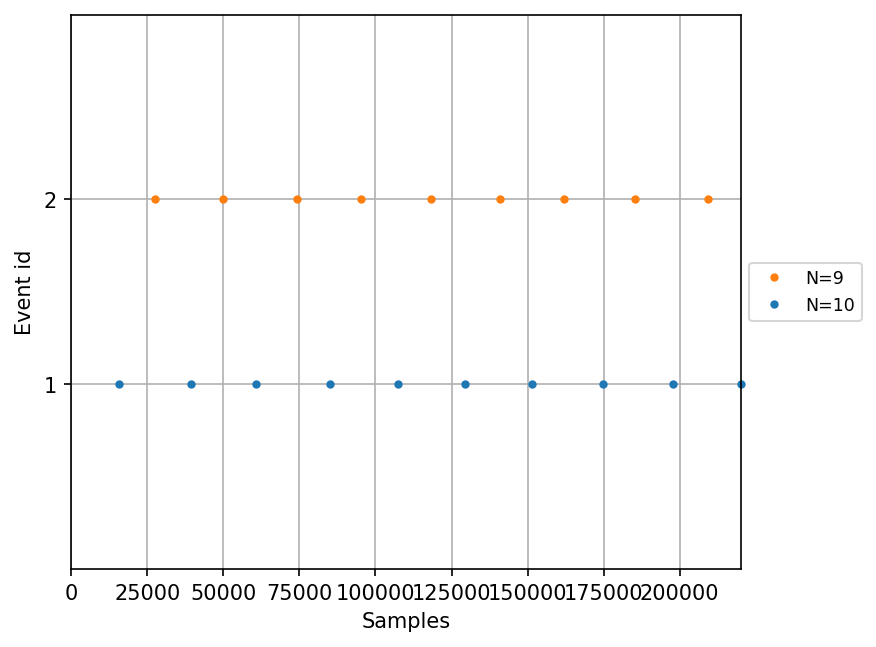

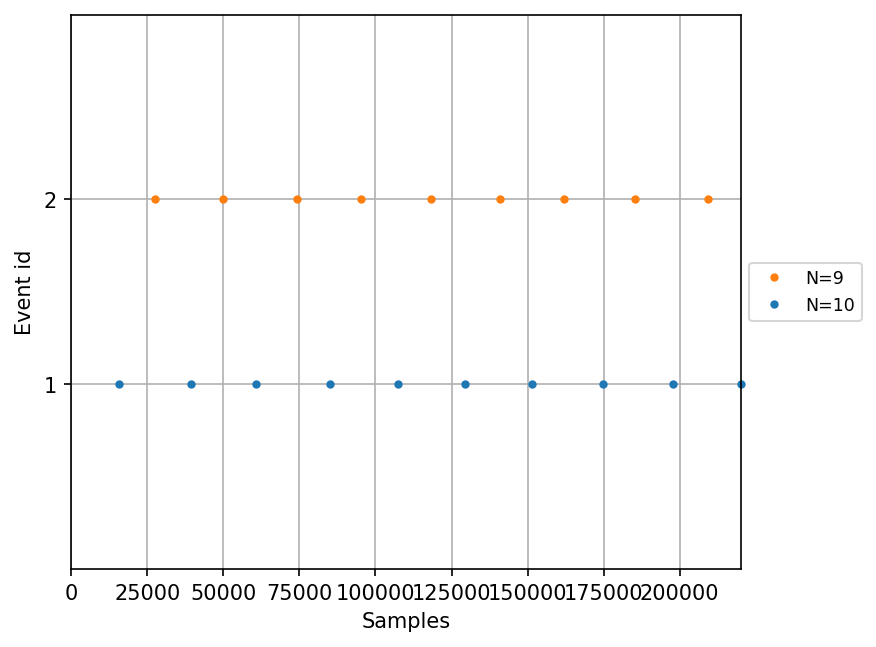

In [52]:
mne.viz.plot_events(events_d[::])

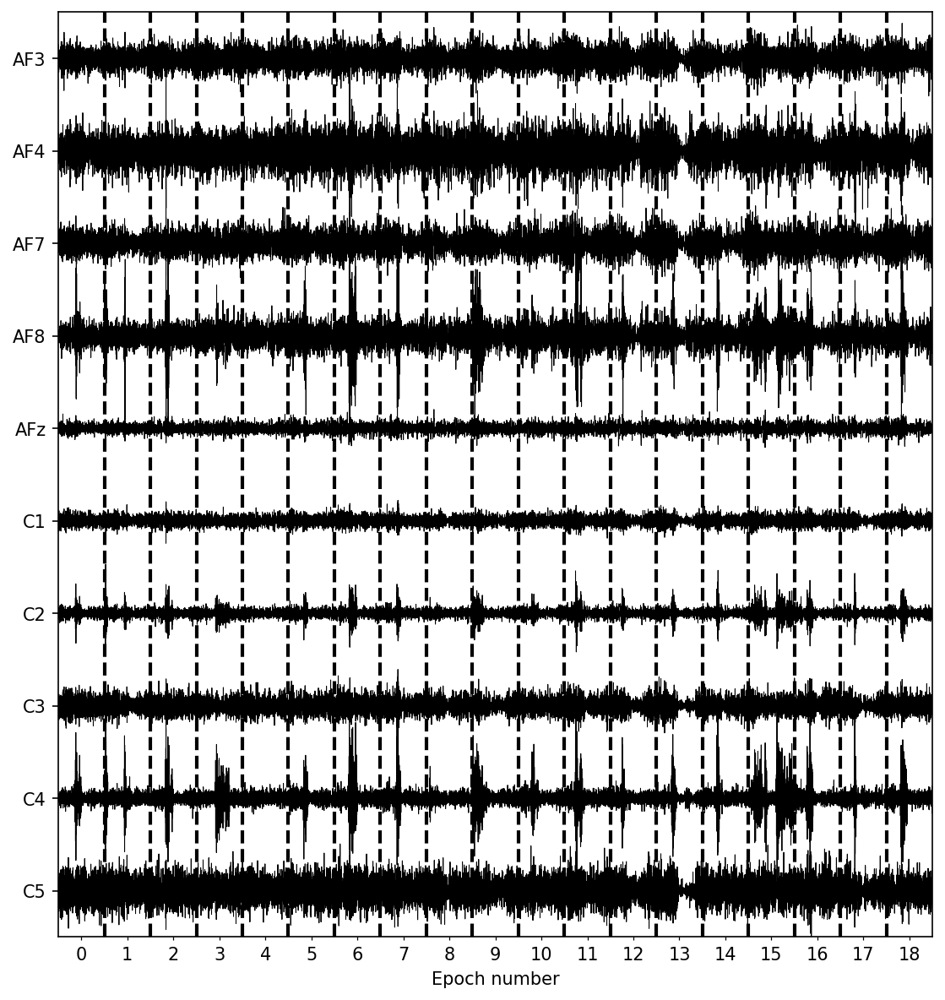

In [74]:
event_ids = dict(extension = 1, flexion = 2)
epochs_g = mne.Epochs(raw_g, events_g, event_id=event_ids,
                    tmin=-3,tmax=3,preload=True)
epochs_d = mne.Epochs(raw_d, events_d, event_id=event_ids,
                    tmin=-3,tmax=3,preload=True)
epochs_g.plot(n_channels=10, scalings=scal,       # EDIT ME!
         show_scrollbars=False, show_scalebars=False);

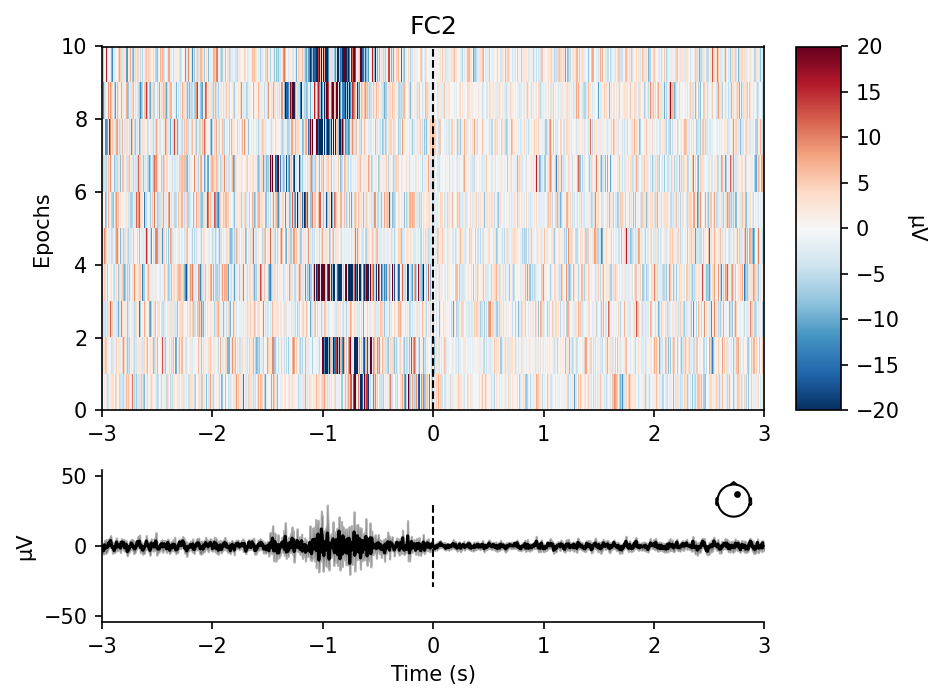

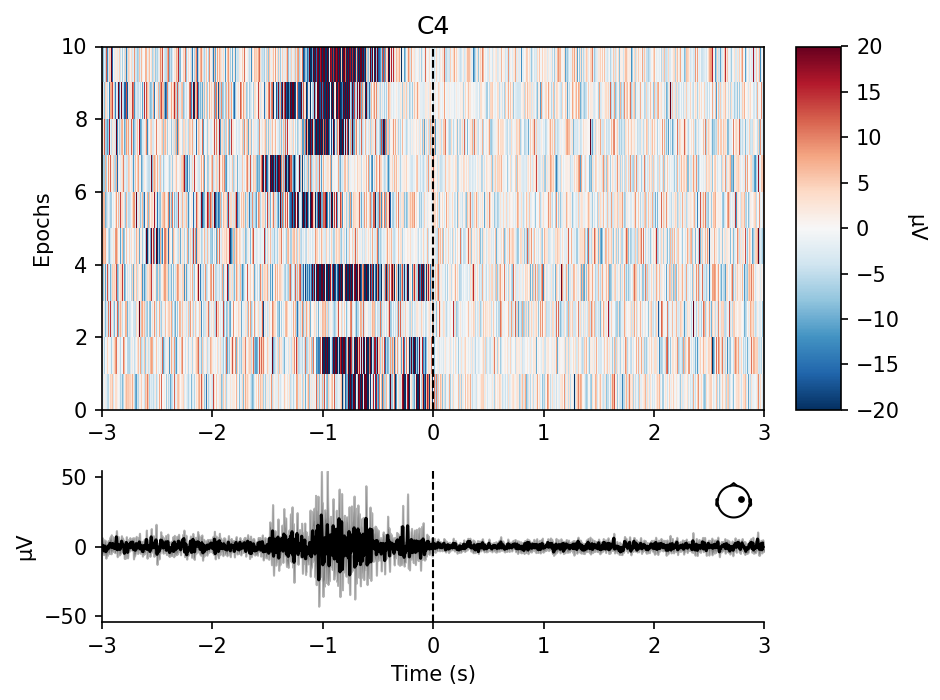

[<Figure size 960x720 with 4 Axes>, <Figure size 960x720 with 4 Axes>]

In [9]:
epochs_g["extension"].plot_image(picks=["FC2","C4"],
                               vmin = -20,
                               vmax = 20)

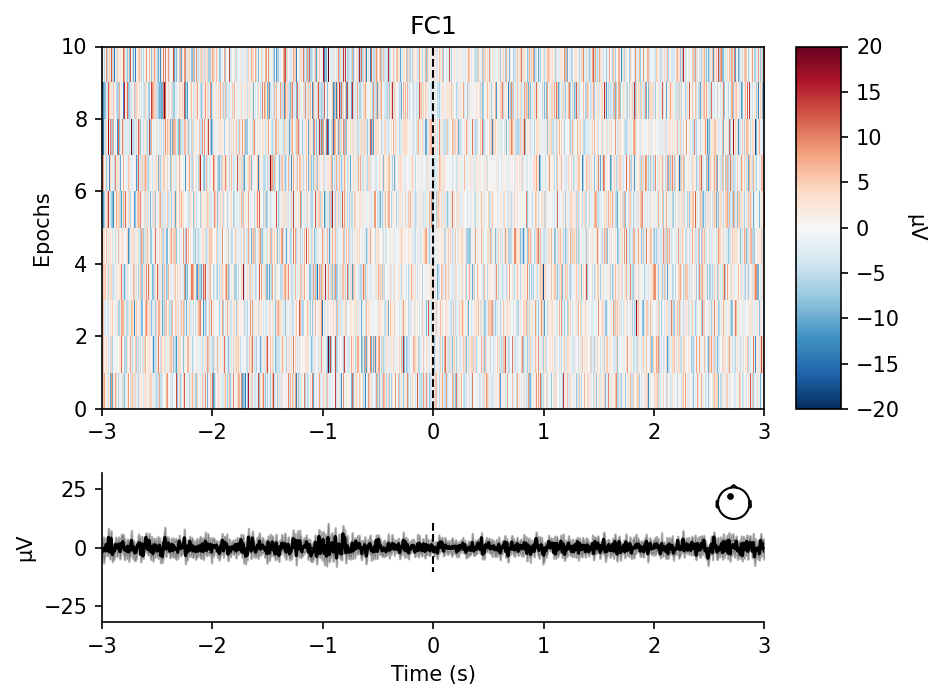

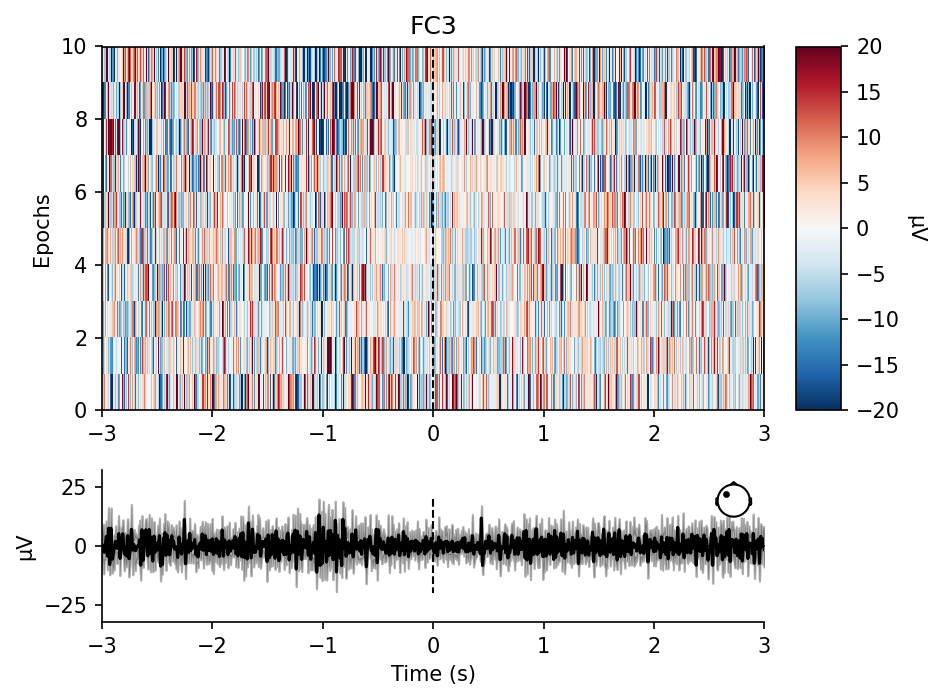

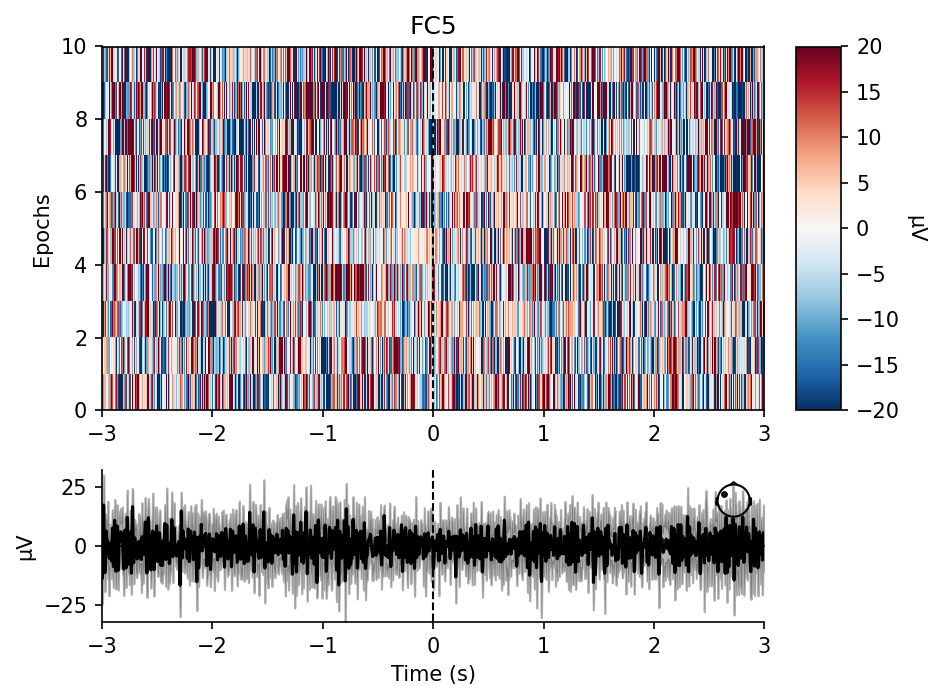

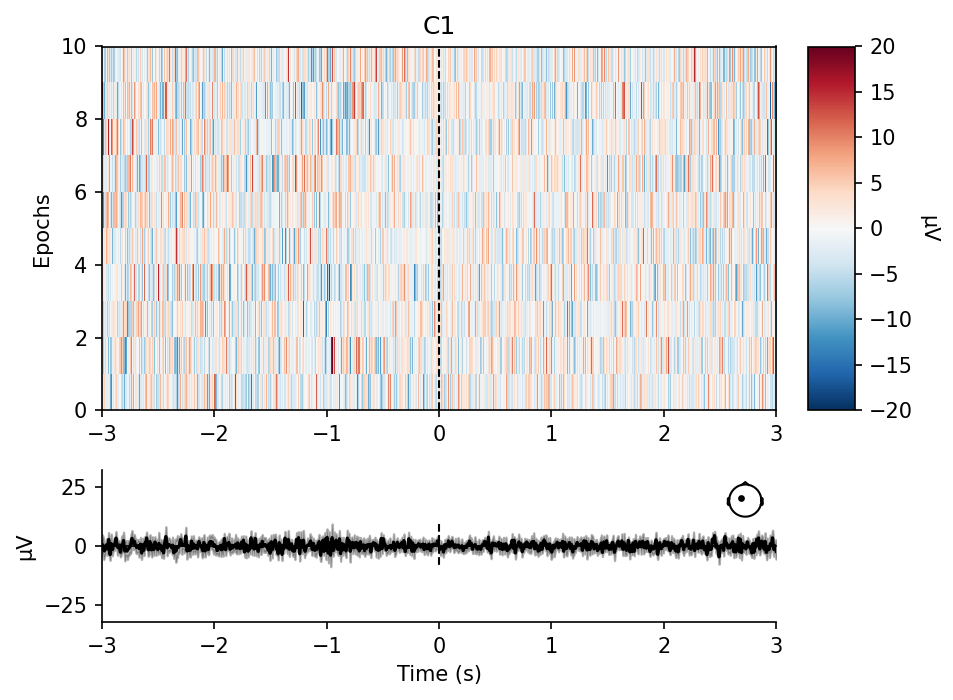

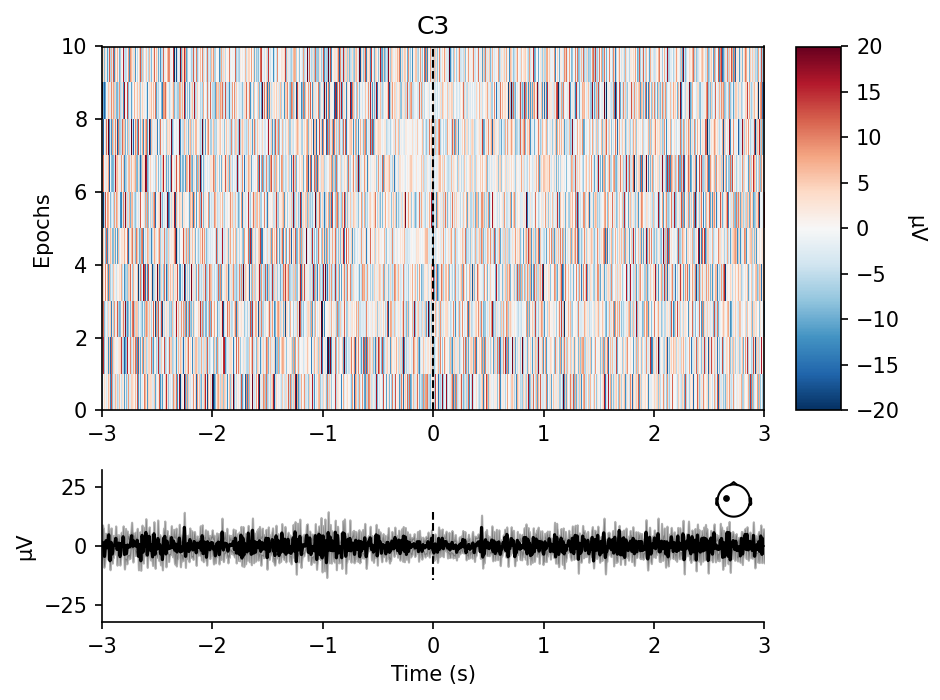

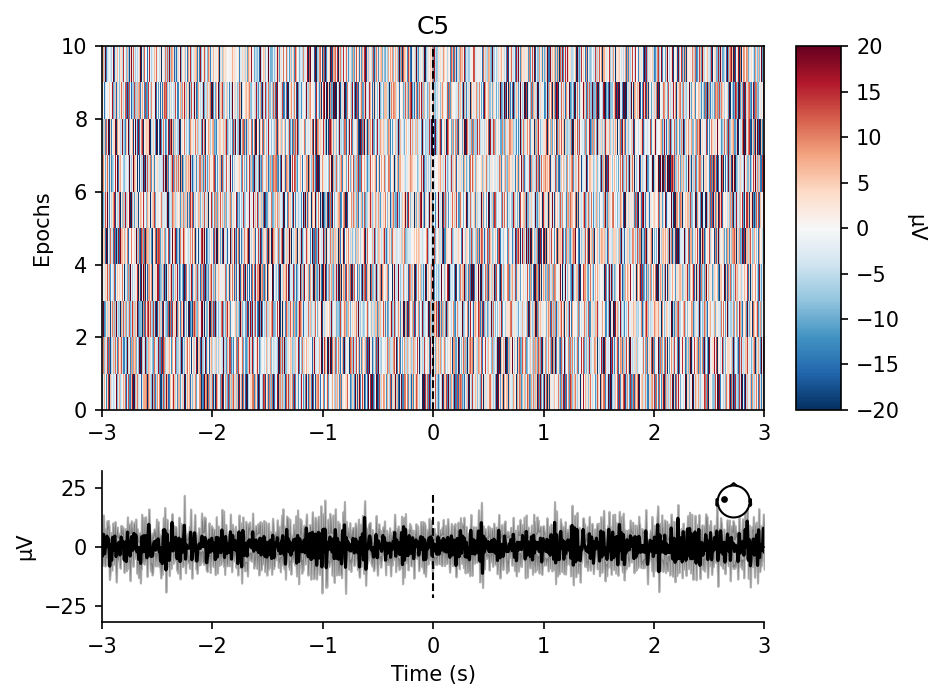

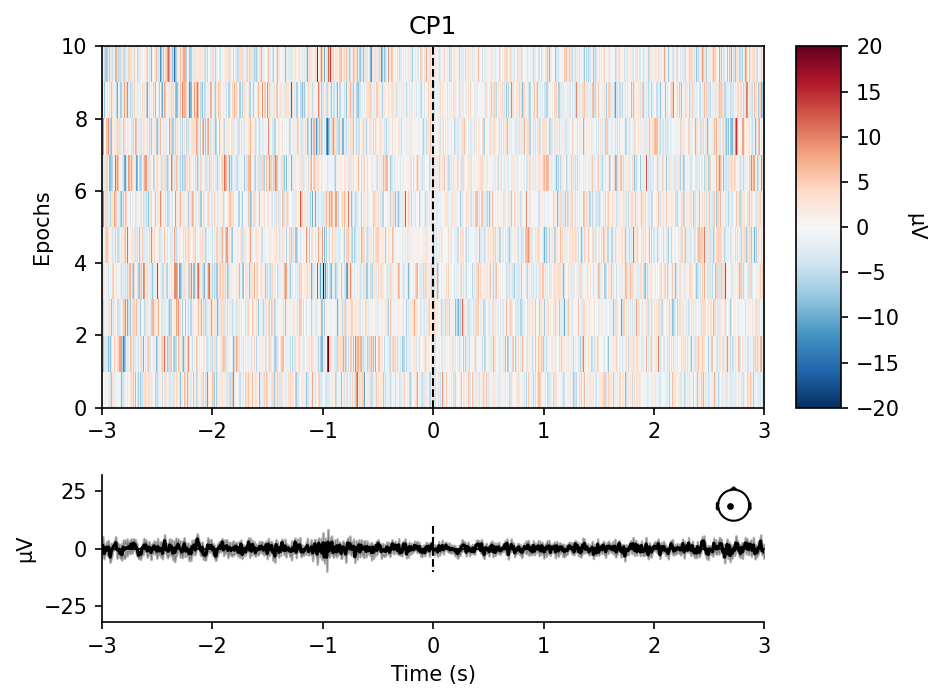

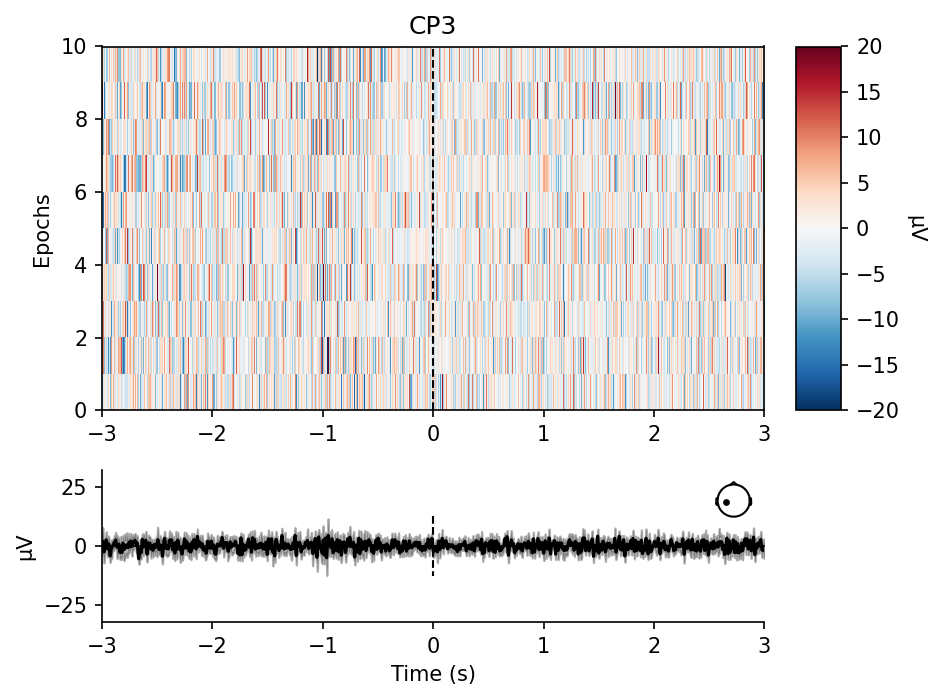

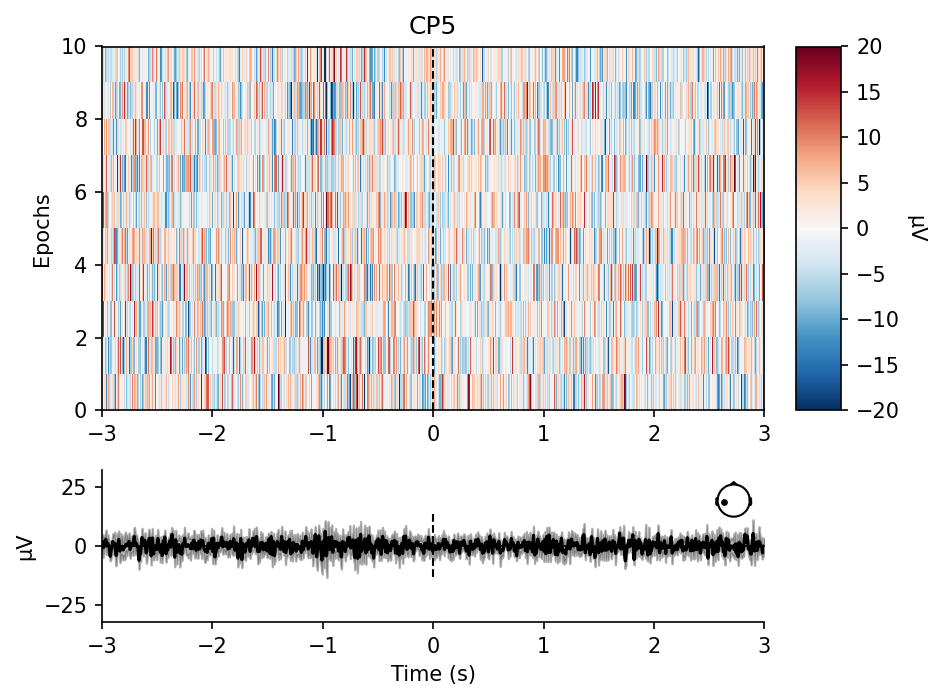

[<Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>]

In [55]:
epochs_g["extension"].plot_image(picks=motor_electrods_g,
                               vmin = -20,
                               vmax = 20)

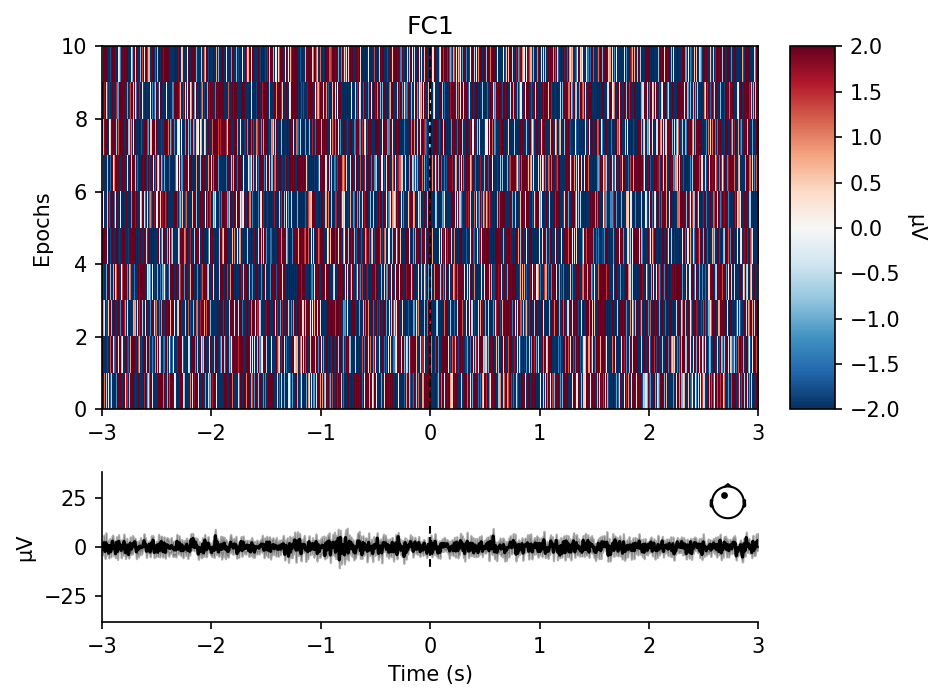

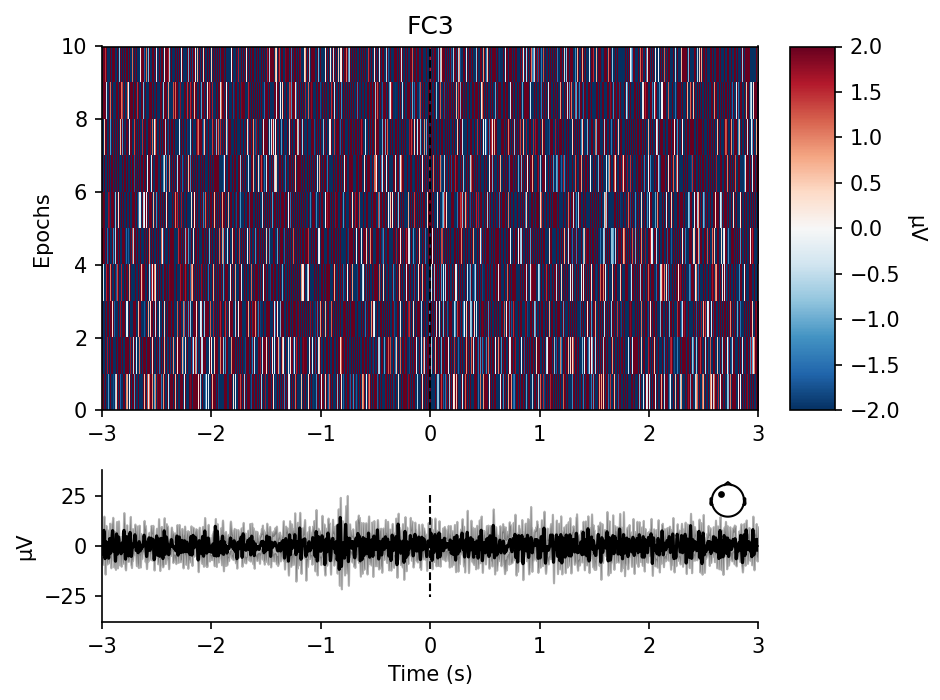

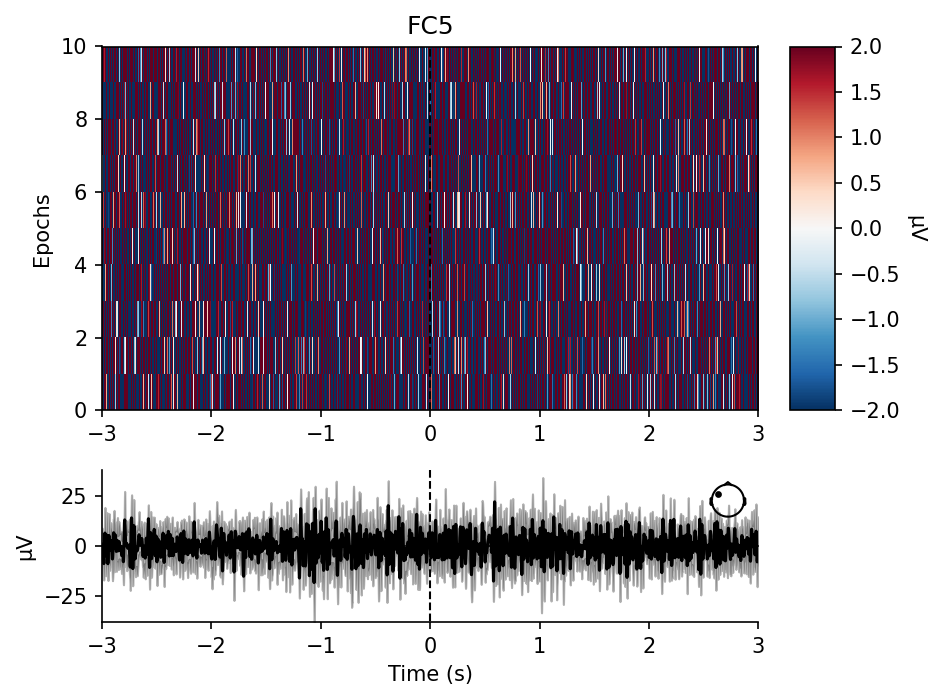

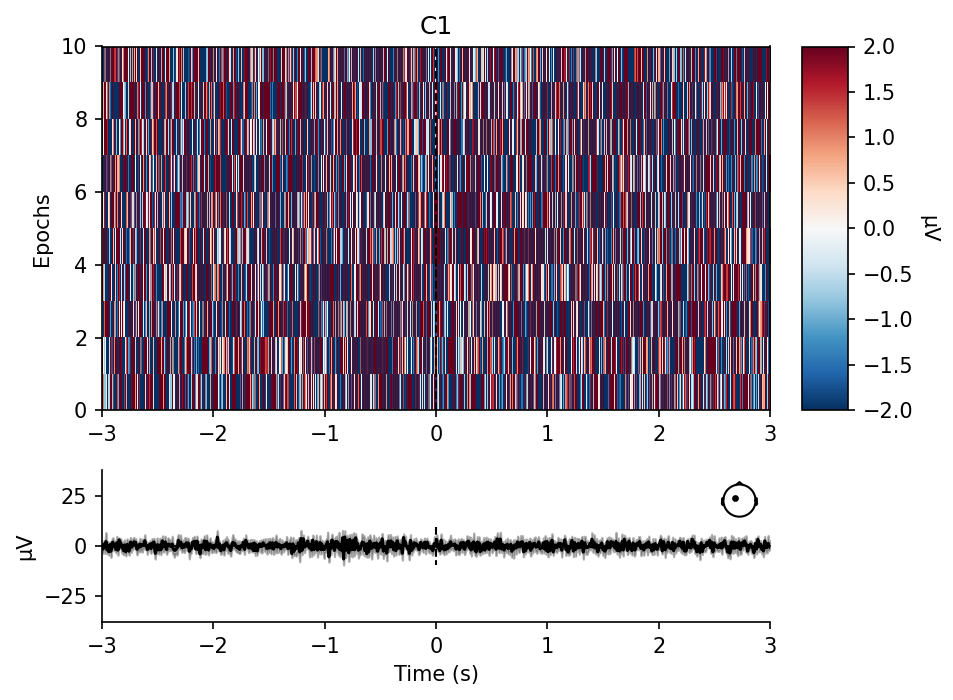

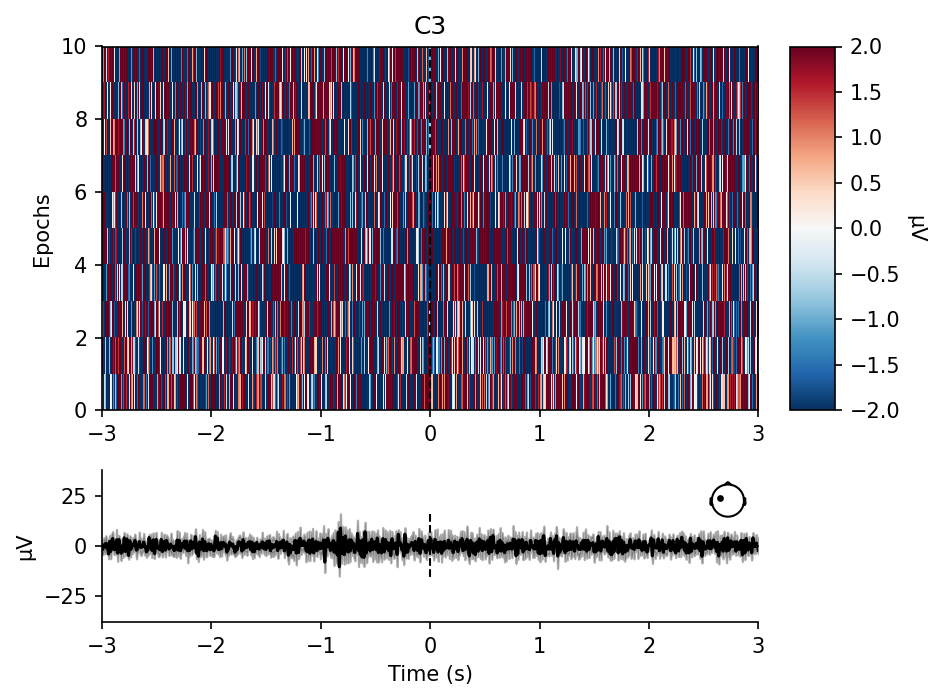

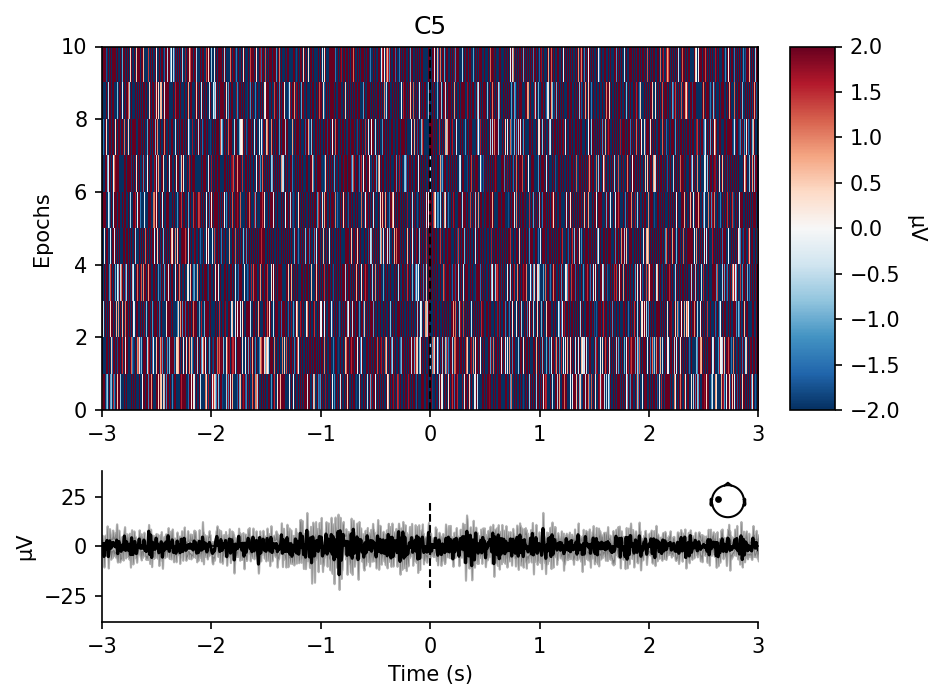

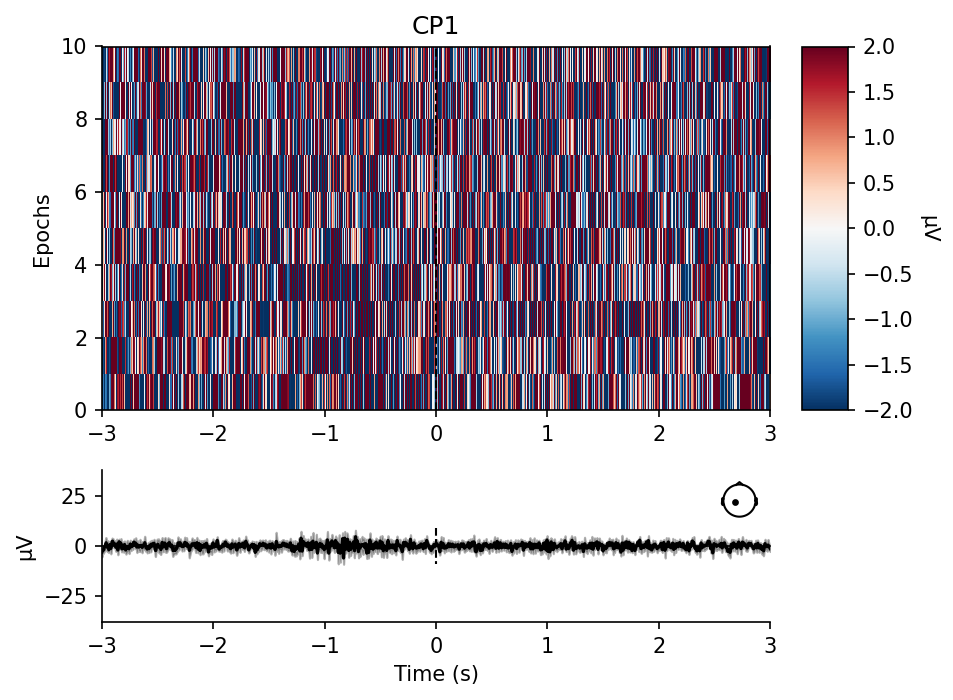

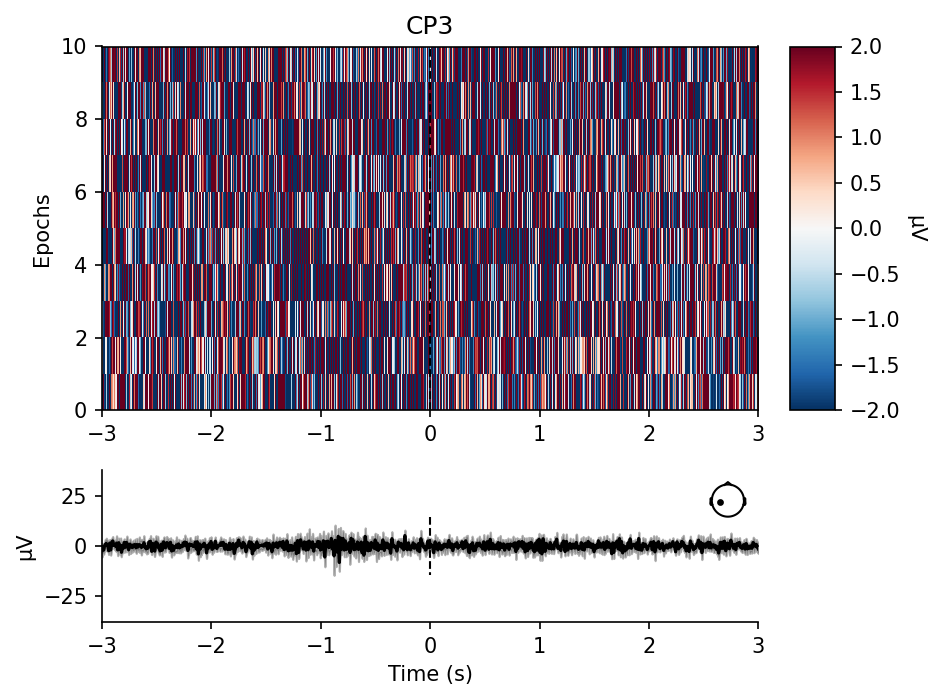

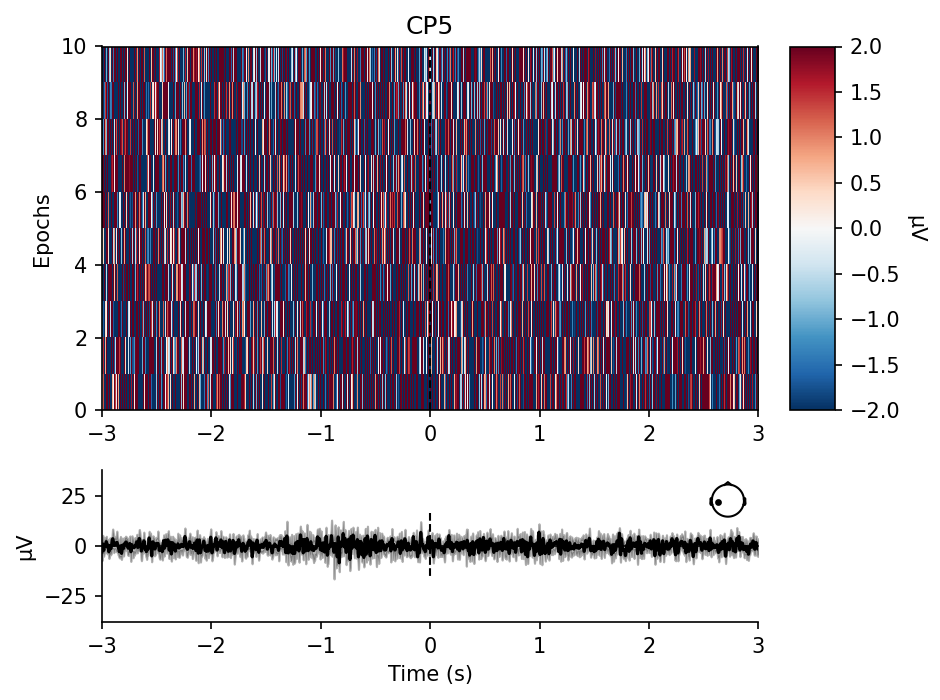

[<Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>]

In [56]:
# On change l'echelle pour le côté Malade --> on a vraiment pas de signal intéréssant 
epochs_d["extension"].plot_image(picks=motor_electrods_g,
                               vmin = -2,
                               vmax = 2)

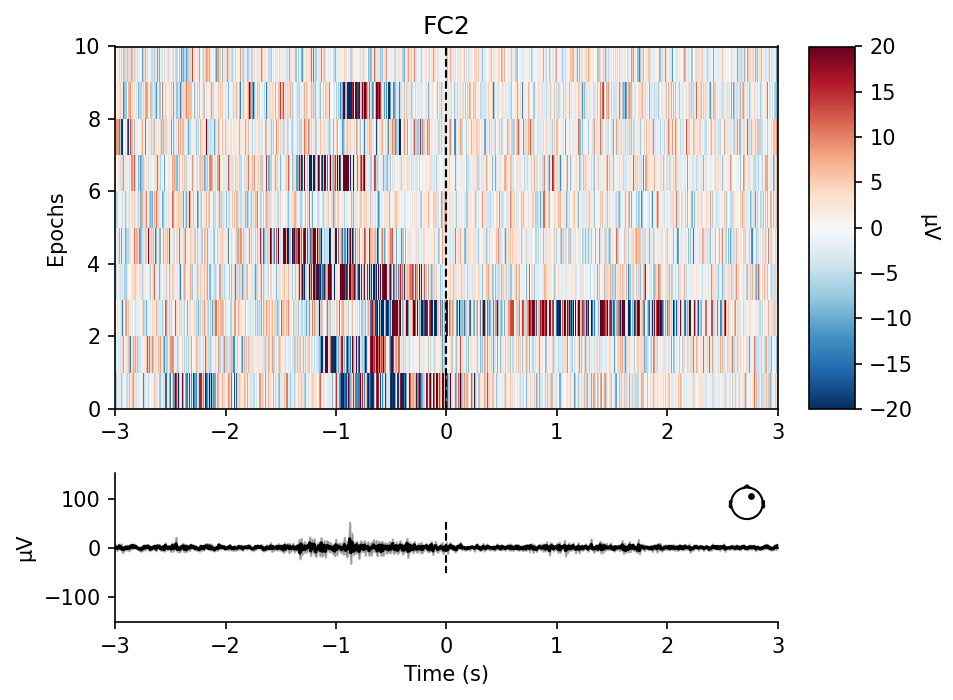

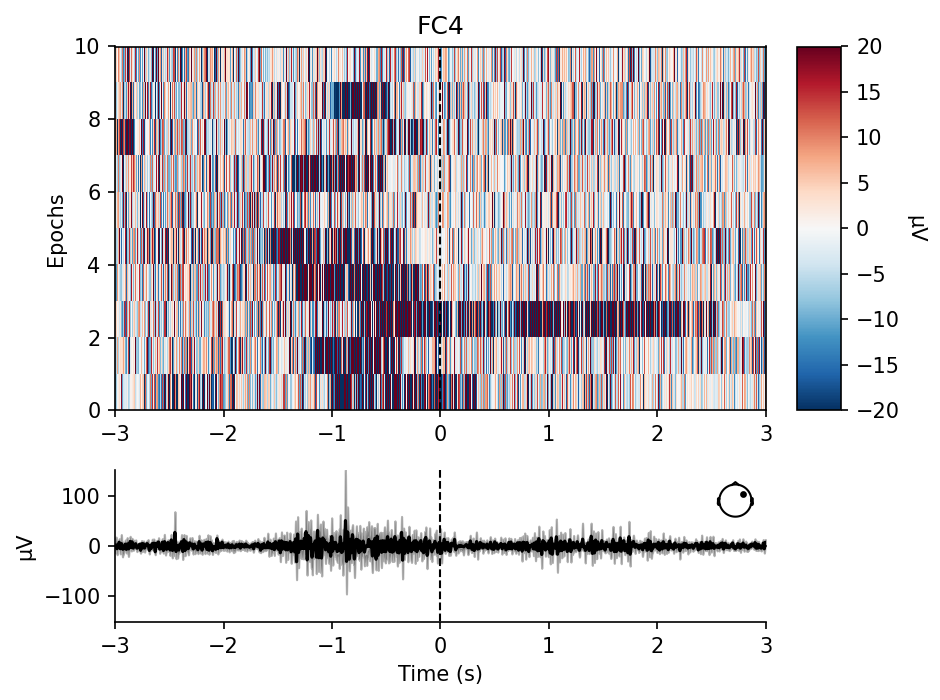

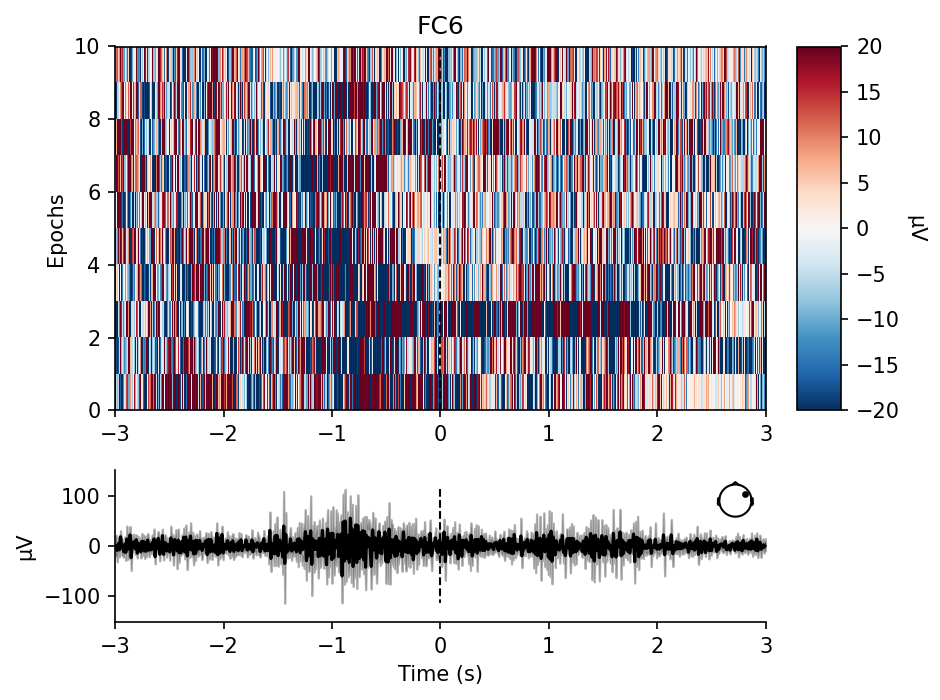

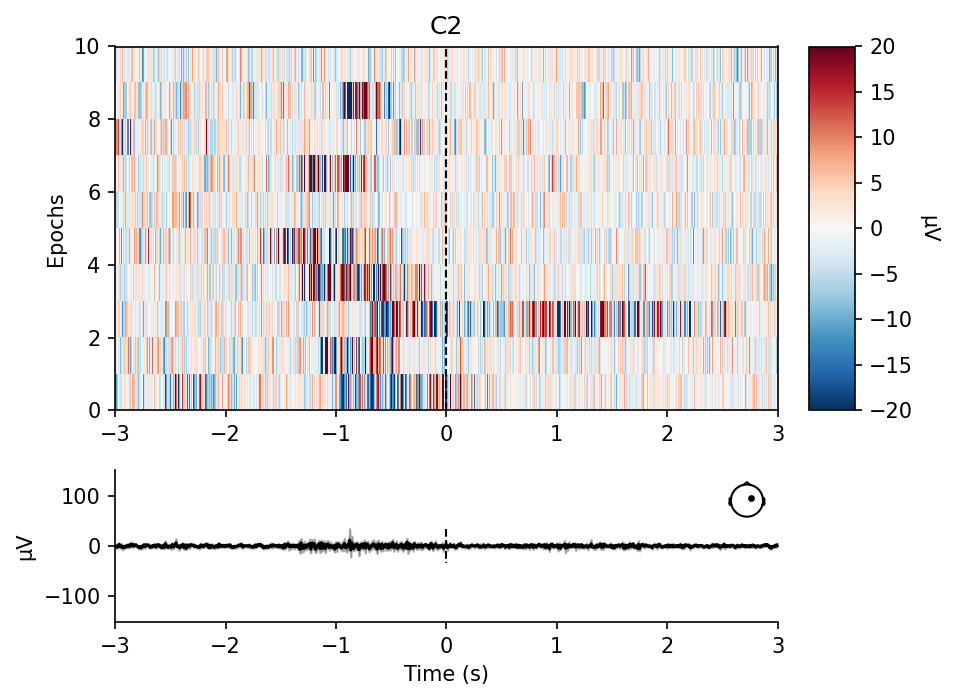

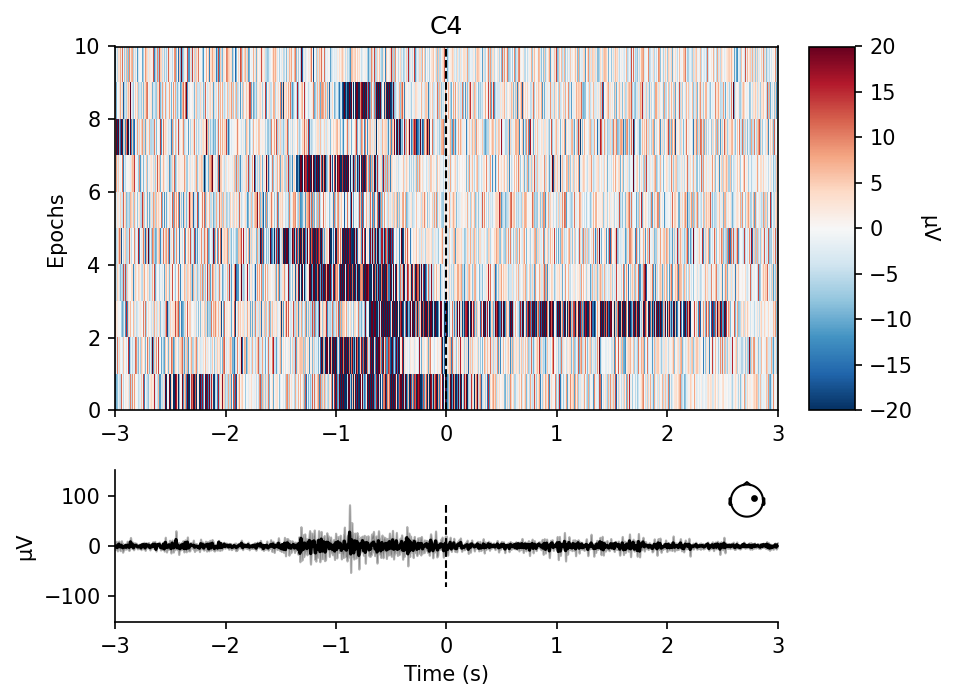

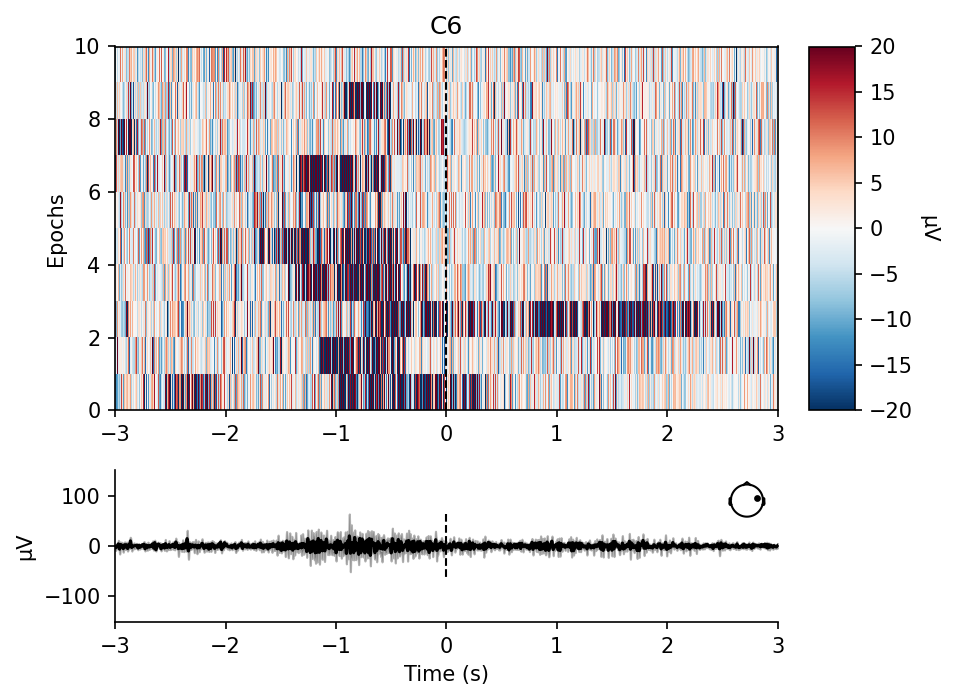

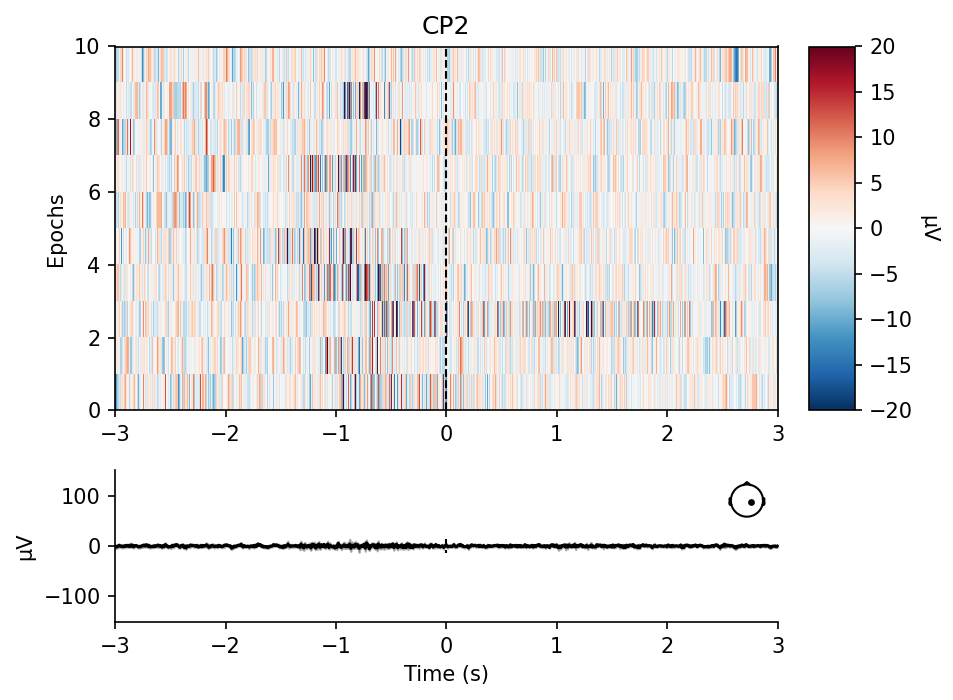

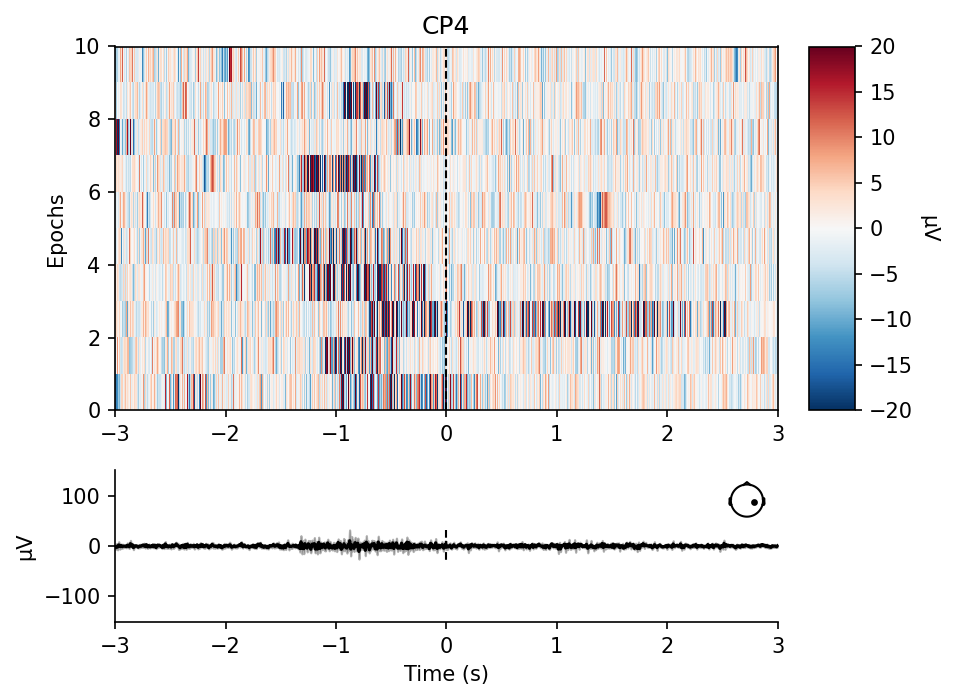

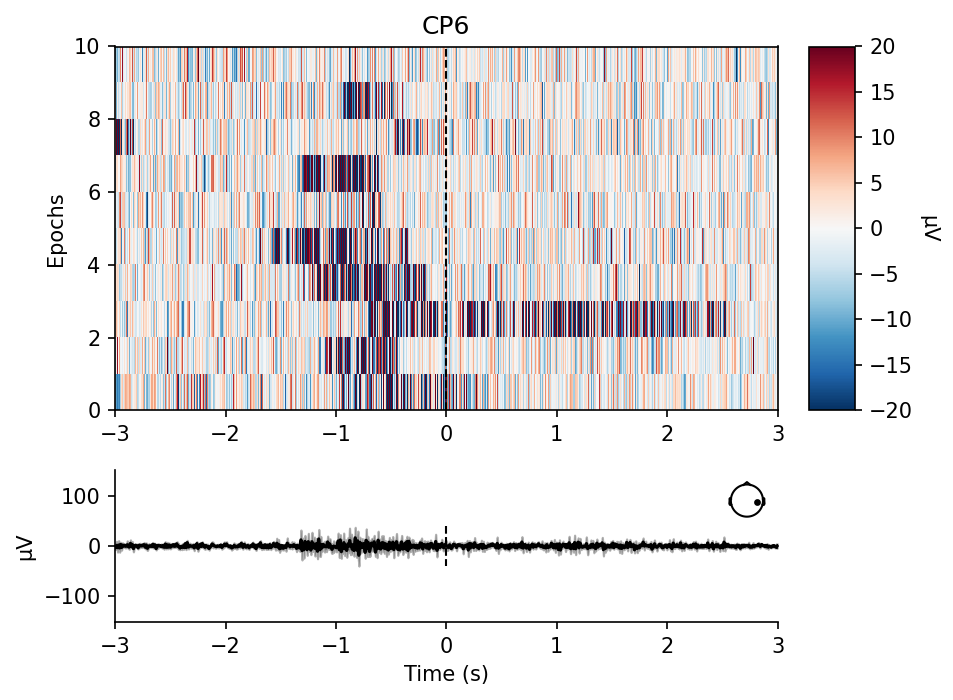

[<Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>,
 <Figure size 960x720 with 4 Axes>]

In [57]:
epochs_d["extension"].plot_image(picks=motor_electrods_d,
                               vmin = -20,
                               vmax = 20)

In [58]:
loader_trial.stroke_side

'G'

# Evoked data

In [73]:
extension_g = epochs_g["extension"].average()
extension_d = epochs_d["extension"].average()

flexion_g = epochs_g["flexion"].average()
flexion_d = epochs_d["flexion"].average()


NameError: name 'epochs_g' is not defined

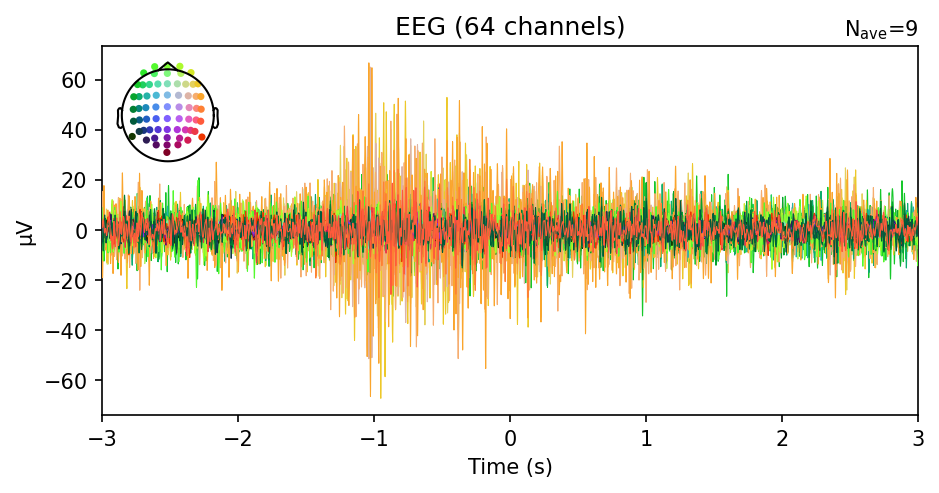

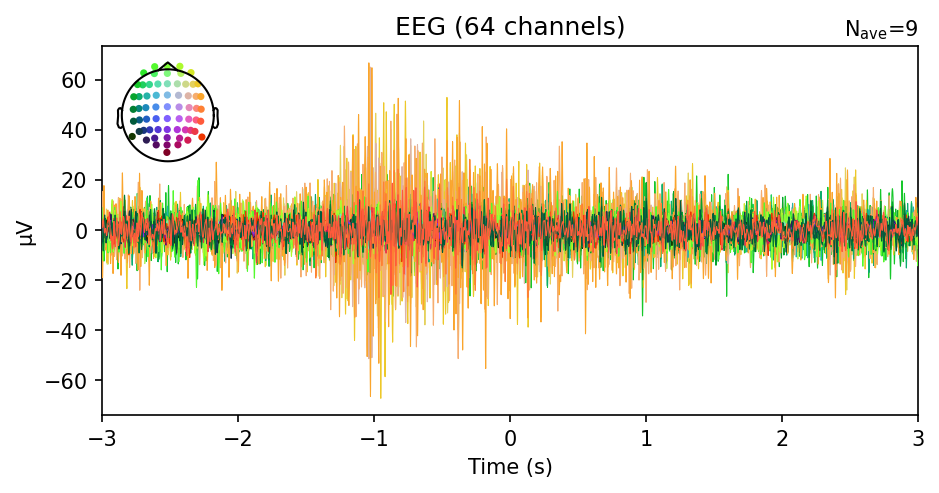

In [60]:
flexion_d.plot()

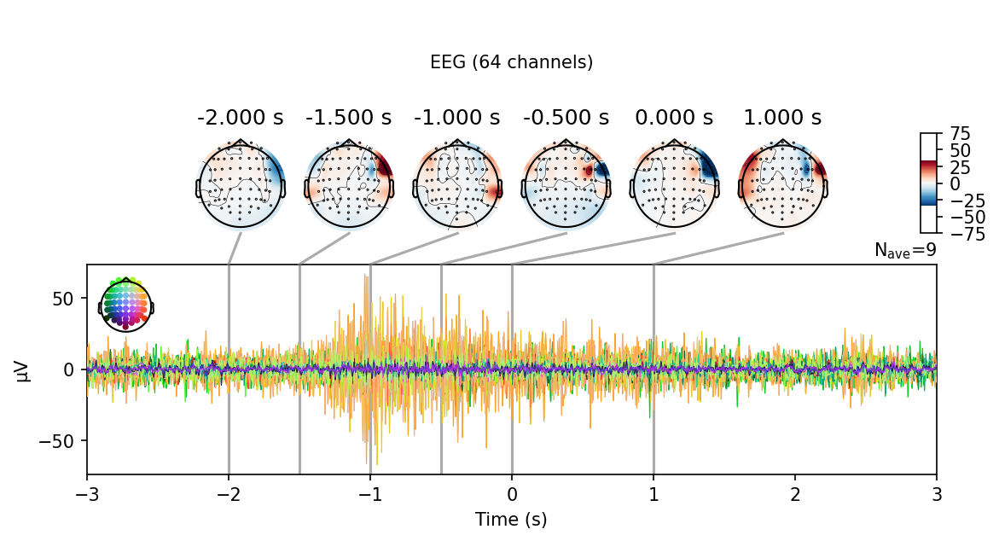

In [61]:
flexion_d.plot_joint(times = [-2,-1.5,-1,-0.5,0,1]);

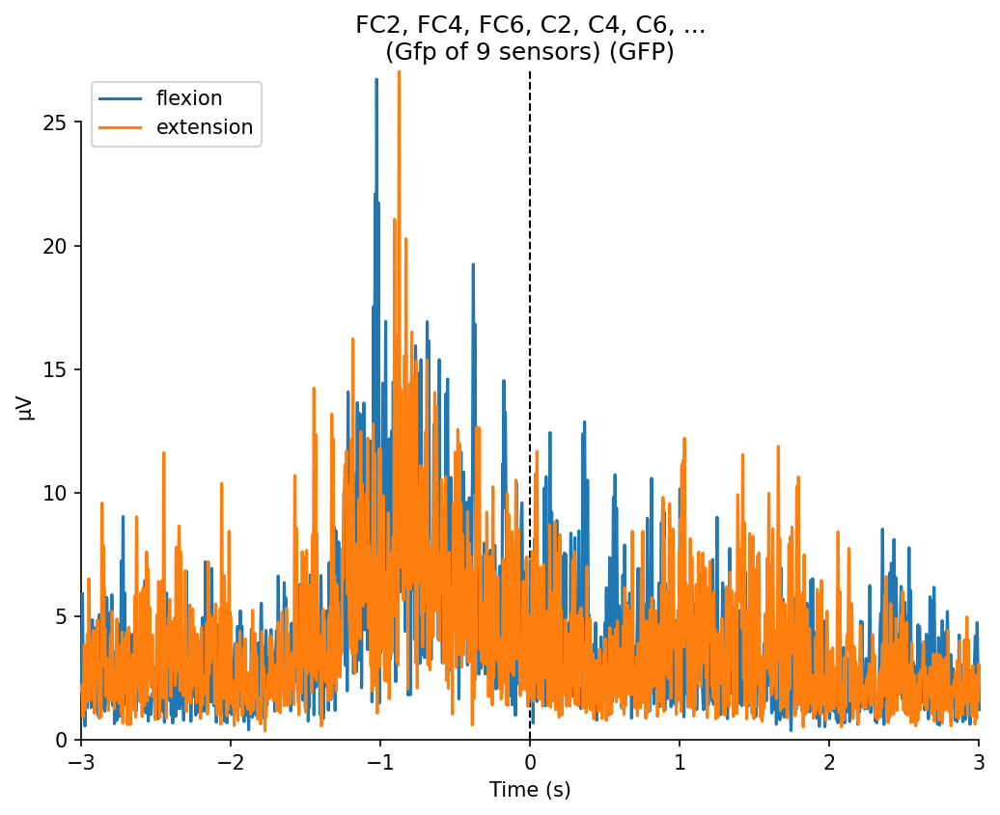

[<Figure size 1200x900 with 1 Axes>]

In [62]:
mne.viz.plot_compare_evokeds({"flexion":flexion_d,
                              "extension":extension_d},
                            picks = motor_electrods_d)

# Frequences analysis 

In [63]:
from mne.time_frequency import tfr_morlet

c:\Users\aurel\Desktop\3ASUPAERO\PIE GIT\PIE_2023\venv\Lib\site-packages\mne\viz\utils.py:161: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


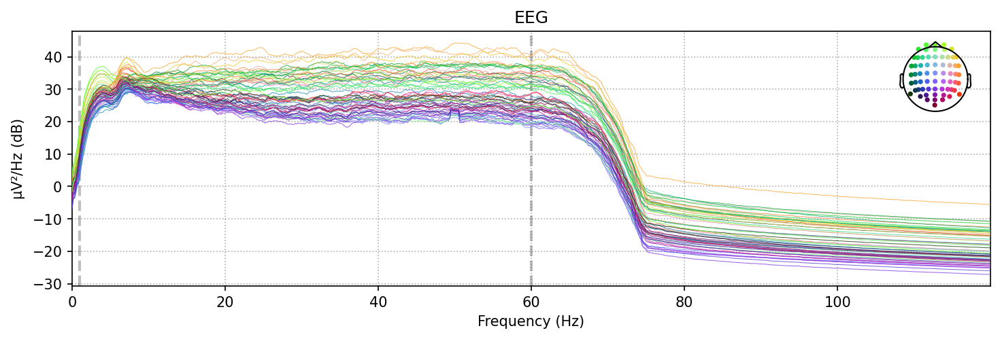

In [23]:
epochs_g.copy().plot_psd(fmin=0, fmax=120)

In [24]:
freqs = list(range(2,40))
tfr_flexion = tfr_morlet(epochs_g["flexion"], freqs, 2, return_itc = False)
tfr_extension = tfr_morlet(epochs_g["extension"], freqs, 2, return_itc = False)

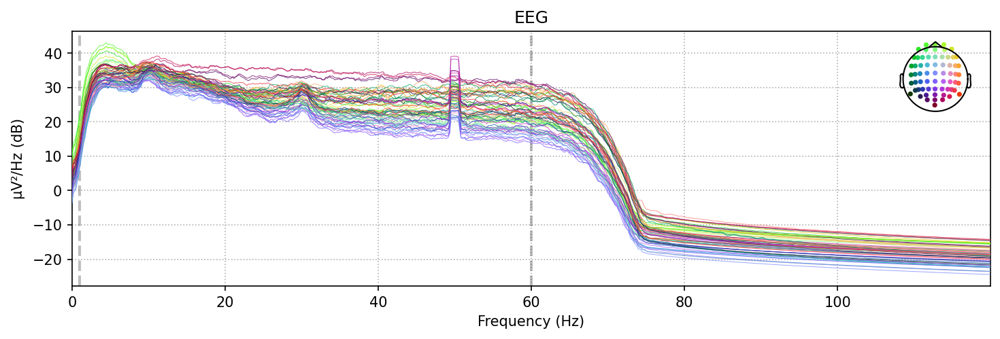

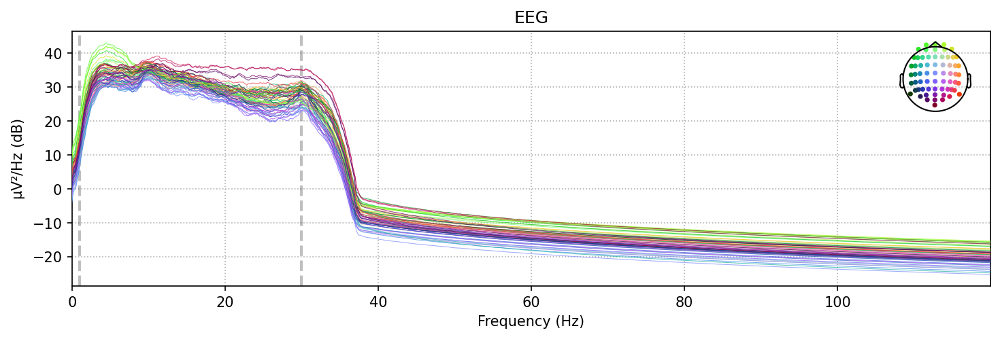

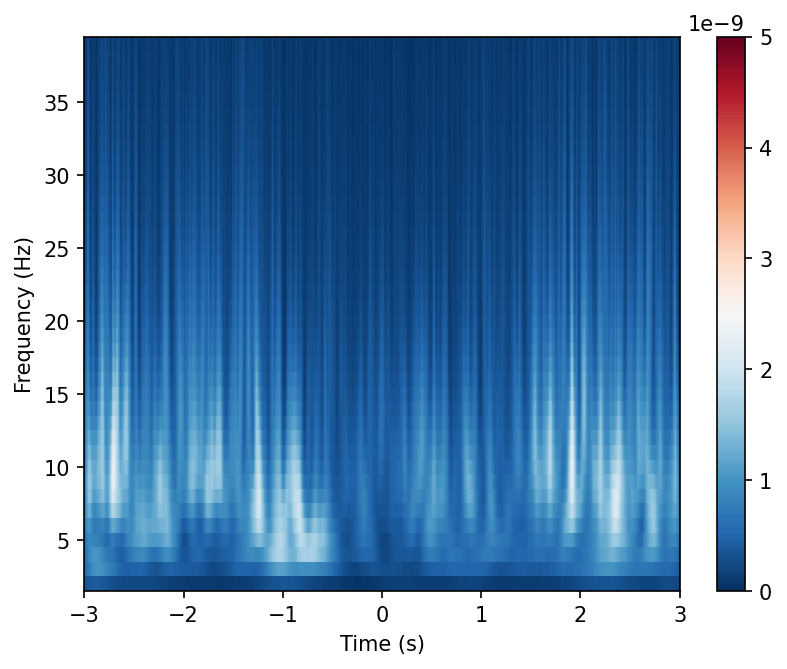

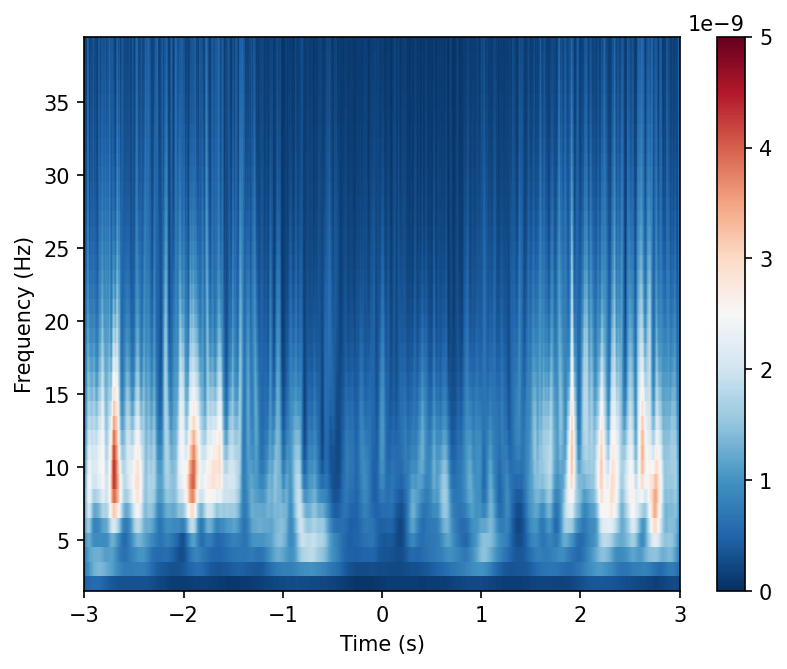

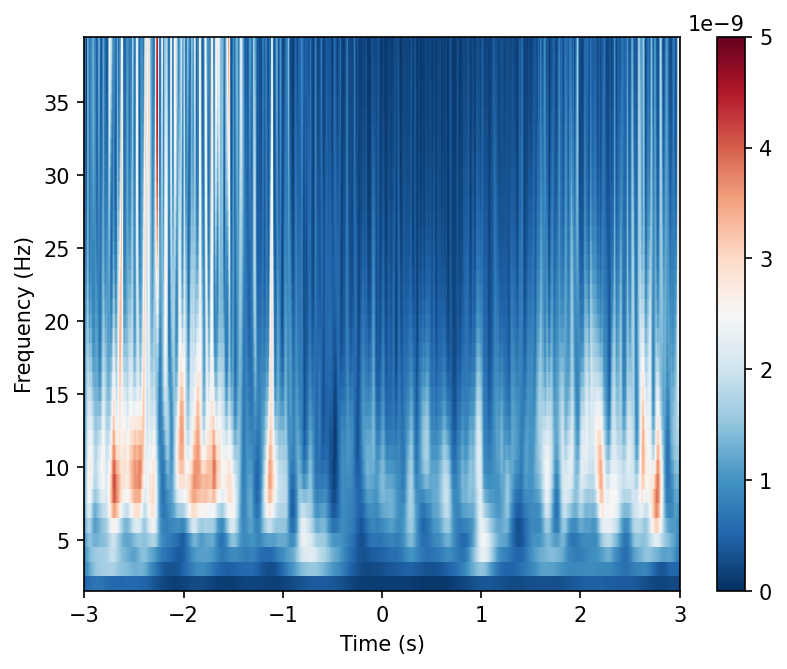

...

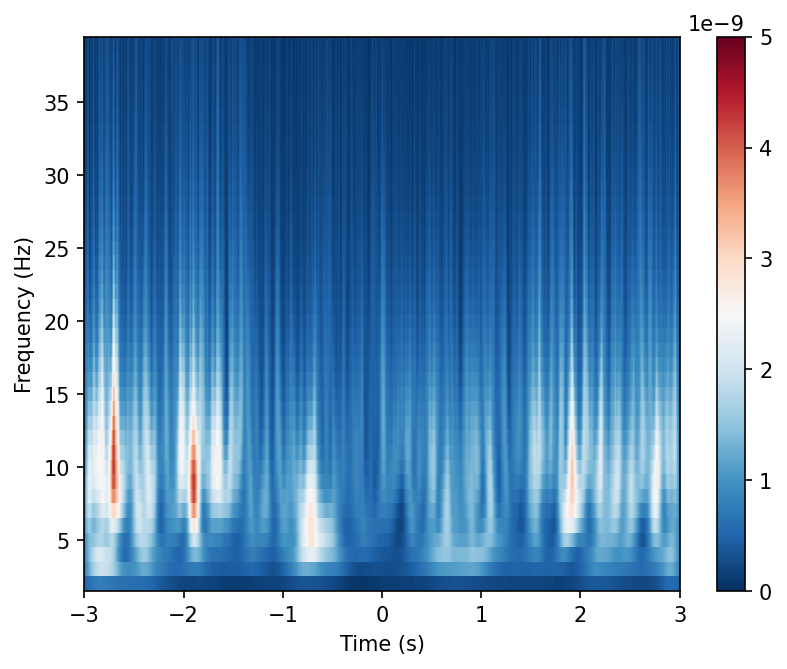

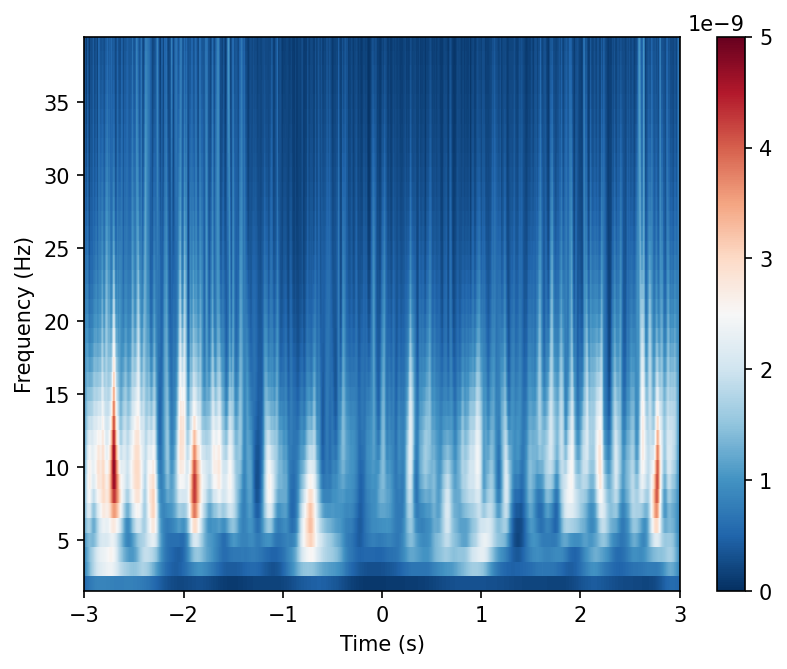

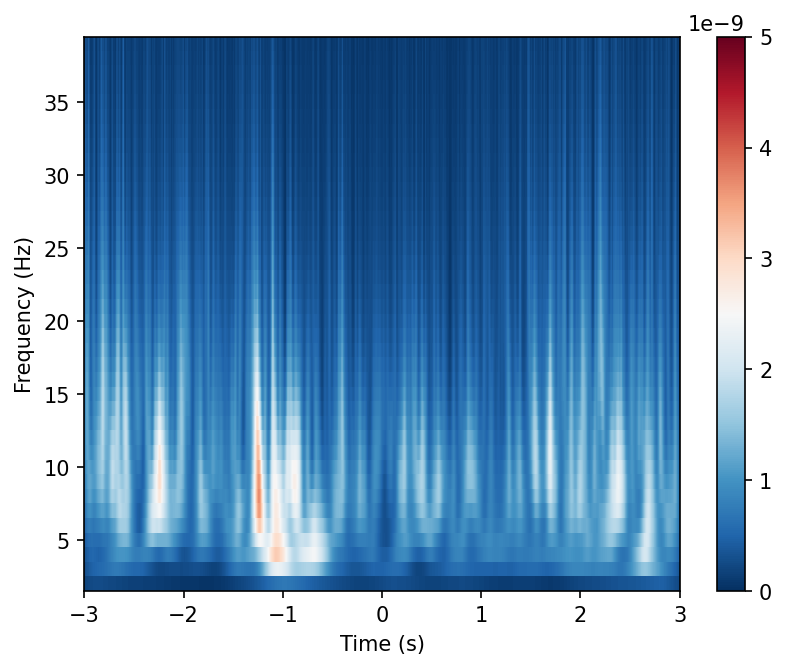

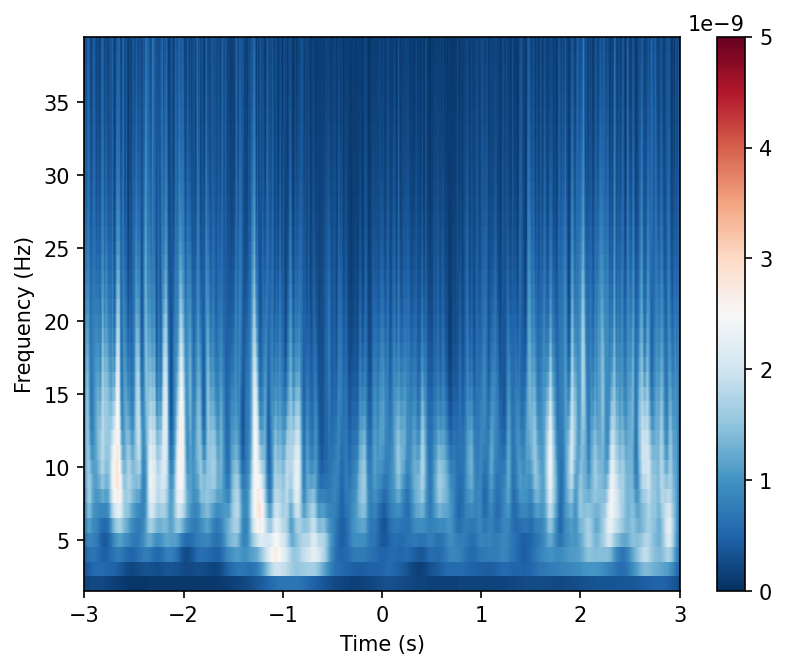

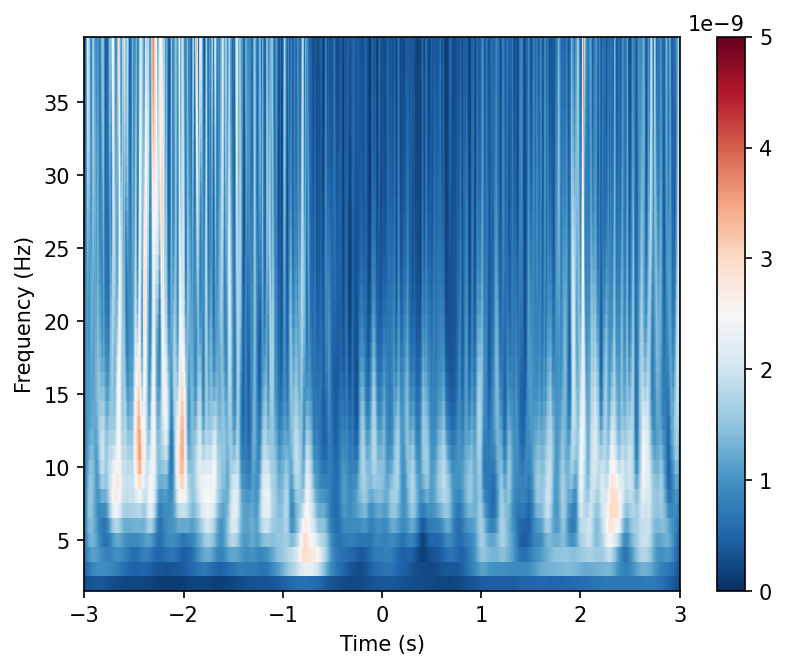

[<Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>,
 <Figure size 960x720 with 2 Axes>]

In [313]:
tfr_extension.plot(picks=motor_electrods_d,vmin=0,vmax=5e-9)

# CSP sur Flexion/Extension

Il faut afficher ça avec les labels mouvement et pas mouvement là on fait uniquement flexion / extension.
Pour ça il faut aller chopper les epochs créées dans les notebooks de Julien, Mathieu ou Rayanne et refaire le même plot.

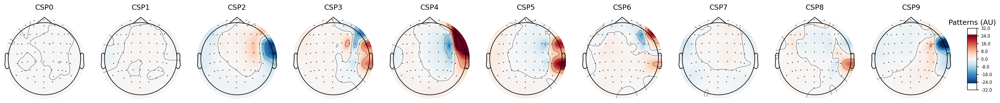

In [99]:
n_components = 10
csp = mne.decoding.CSP(n_components=n_components)
csp.fit(epochs_g.copy().pick(picks="eeg").get_data(), events_g[:,2])
csp.plot_patterns(epochs_g.copy().pick(picks="eeg").info, ch_type='eeg', units='Patterns (AU)', size=1.5);

In [76]:
epochs_g.copy().pick(picks="eeg").get_data().shape

(19, 64, 6145)

In [128]:
csp_data.shape

(19, 20)

C:\Users\aurel\AppData\Local\Temp\ipykernel_22340\3455236971.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


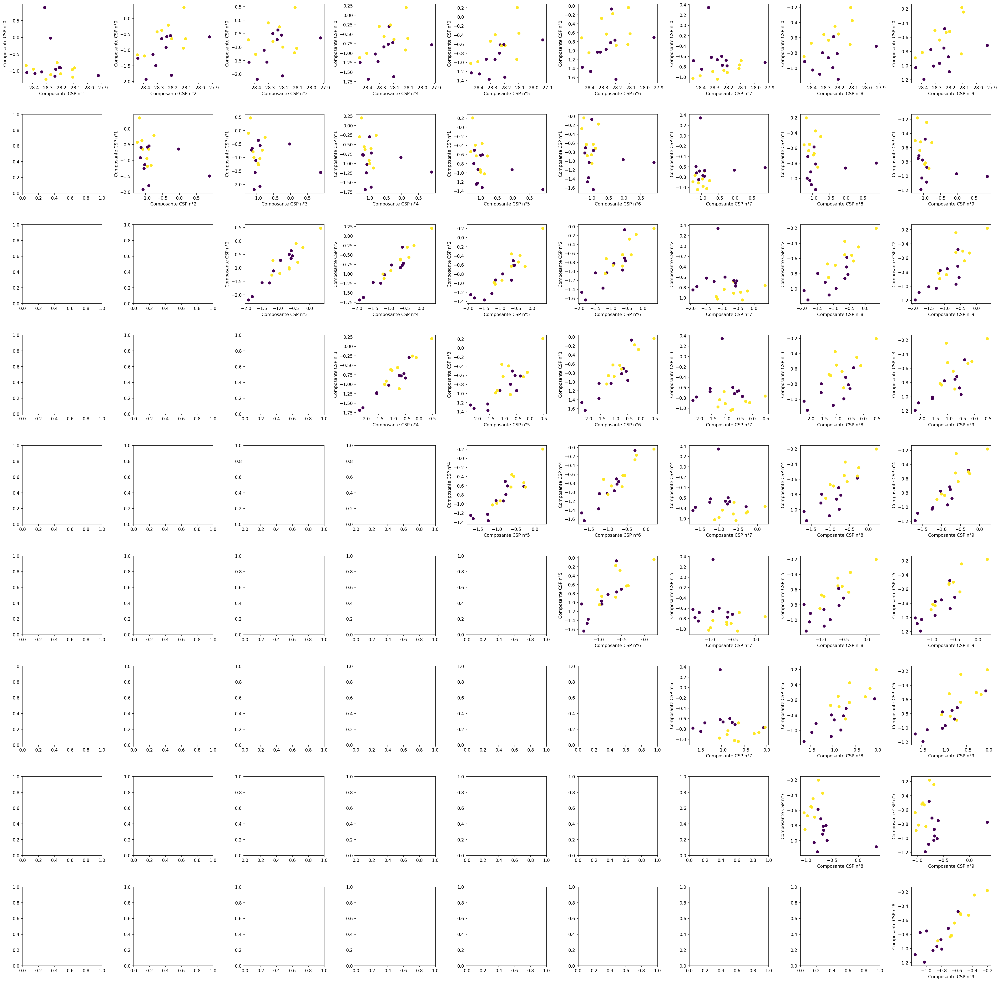

In [100]:
## Ici on fait une CSP par rapport à la flexion/extension
## Notre problème c'est reconnaitre l'intention de mouvement par rapport à "la non intention de mouvement"
# Définir la taille de chaque vignette
figsize_per_subplot = 4  # Choisissez la taille appropriée en pouces

# Calculer la taille totale de la figure en fonction du nombre de sous-plots
figsize = (n_components * figsize_per_subplot, n_components * figsize_per_subplot)

# Créer une figure avec une grille spécifique
fig, axs = plt.subplots(n_components-1, n_components-1, figsize=figsize, gridspec_kw={'wspace': 0.4, 'hspace': 0.4})

for i in range(n_components):
    for j in range(i+1, n_components):
        # Sélectionner la première composante CSP
        csp_component_y = csp_data[:, i]

        # Sélectionner la dernière composante CSP
        csp_component_x = csp_data[:, j]

        # Faire un graphe avec la première composante en ordonnées et la dernière en abscisses
        ax = axs[i, j-1]  # Utilisation de la grille spécifique
        ax.scatter(csp_component_y, csp_component_x, c=labels, cmap='viridis')
        ax.set_xlabel(f'Composante CSP n°{j}')
        ax.set_ylabel(f'Composante CSP n°{i}')

# Ajuster automatiquement la disposition des sous-plots pour éviter le chevauchement
plt.tight_layout()

plt.show()

# CSP sur Mouvement/PasMouvement

In [13]:
from preprocessing import DataLoader
import numpy as np
import matplotlib.pyplot as plt
import mne
import os

Chargement des données à l'aide de la fonction de Julien


In [15]:
NUMBER_OF_SESSIONS = 30

# Fréquence de filtrage
FMIN = 1
FMAX = 40

# Bornes époques
EPOCHS_TMIN = -1
EPOCHS_TMAX = 2

# temps depuis le mouvement pour époquer autours d'une plage sans mouvement
EPOCHS_EMPTY_FROM_MVT_TMINS = -4

BINARY_CLASSIFICATION = True

RANDOM_STATE = 42
N_SPLIT = 4

FOLDER_PATH = './../../data/raw/Data_npy/'
FILE_PATH_LIST = [FOLDER_PATH + file_path for file_path in os.listdir(FOLDER_PATH) if file_path.endswith('.npy')]

def get_channels(raws, side):
    endings = ('1', '3', '5', '7', '9') if side=='D' else ('2', '4', '6', '8', '10')
    channels_to_remove = [channel for channel in raws.ch_names if channel.endswith(endings)]
    channels = [channel for channel in raws.ch_names if channel not in channels_to_remove]
    return channels


import tqdm

def preproc(file_path_list, verbose=False):
    # structure data_patients = [session1, session2, ...]            dtype = list
    # structure data_session  = [epoch1, epoch2, ...]                dtype = np.array
    # structure epoch         = np.array([channel1, channel2, ...])  dtype = np.array
    # structure channel       = np.array([time1, time2, ...])        dtype = float

    # structure labels_patients     = [session1, session2, ...]            dtype = list
    # structure labels_session      = [label_epoch1, label_epoch2, ...]    dtype = int (0, 1, 2)

    data_patients = []
    labels_patients = []

    patients_id = []
    sessions_id = []

    for file in tqdm.tqdm(file_path_list):

        # loading data / auto labeling behind the scene
        data_loader = DataLoader(file)

        # picking the arm session opposite to the stroke side
        stroke = data_loader.stroke_side
        arm_side = 'G' if stroke == 'D' else 'G'
        raws = data_loader.get_raws(side=arm_side)
        
        # if no data for the arm side, we skip the session
        if raws is None:
            continue

        # picking channels of only the stroke side
        raws.pick_channels(get_channels(raws, stroke))

        # filtering
        raws.filter(FMIN, FMAX, fir_design='firwin')

        # creating epochs over flexion and extension of the arm (movement)
        events = mne.find_events(raws, stim_channel=['movement'])
        picks = mne.pick_types(raws.info, eeg=True, stim=False)
        epochs = mne.Epochs(raws, events, tmin=EPOCHS_TMIN, tmax=EPOCHS_TMAX, picks=picks, baseline=None, preload=True)
        epochs_data_mvt = epochs.get_data()
        label_mvt = epochs.events[:, -1]

        # creating artificial epoch when no movement
        epochs_no_mvt = mne.Epochs(raws, events, tmin=EPOCHS_EMPTY_FROM_MVT_TMINS, tmax=EPOCHS_EMPTY_FROM_MVT_TMINS+EPOCHS_TMAX-EPOCHS_TMIN, 
                                    picks=picks, baseline=None, preload=True)
        epochs_data_no_mvt = epochs_no_mvt.get_data()
        labels_no_mvt = np.zeros(epochs_data_no_mvt.shape[0])

        # concatenating epochs
        epochs_data_session = np.concatenate((epochs_data_mvt, epochs_data_no_mvt), axis=0)
        labels_session = np.concatenate((label_mvt, labels_no_mvt), axis=0)

        # Shuffling epochs
        random_state = np.random.RandomState(RANDOM_STATE)
        indices = np.arange(epochs_data_session.shape[0])
        random_state.shuffle(indices)
        epochs_data_session = epochs_data_session[indices]
        labels_session = labels_session[indices]

        # if binary classification, we merge flexion and extension
        if BINARY_CLASSIFICATION:
            labels_session[labels_session != 0] = 1

        # adding session data and session labels to data_patients and labels_patients (if new patient, add new list)
        if data_loader.patient_id not in patients_id:
            patients_id.append(data_loader.patient_id)
            sessions_id.append([])
            data_patients.append([])
            labels_patients.append([])
        sessions_id[patients_id.index(data_loader.patient_id)].append(data_loader.session_id)
        data_patients[patients_id.index(data_loader.patient_id)].append(epochs_data_session)
        labels_patients[patients_id.index(data_loader.patient_id)].append(labels_session)

        if verbose:
            print(f'patient id: {data_loader.patient_id}')
            print(f'session id: {data_loader.session_id}')
            print(f'number of epochs: {epochs_data_session.shape[0]}')
            print(f'number of channels: {epochs_data_session.shape[1]}')
            print(f'number of time samples: {epochs_data_session.shape[2]}')

    return data_patients, labels_patients, patients_id, sessions_id



In [16]:
%%time
data_patients, labels_patients, patients_id, sessions_id= preproc(FILE_PATH_LIST[:NUMBER_OF_SESSIONS])
print(f'number of patients: {len(data_patients)}')
print(f'{len(data_patients[0])} sessions for the first patient')
print(f'{len(data_patients[0][0])} epochs for the first session of the first patient')
print(f'size of one session: {data_patients[0][0].shape}')
print(f'size of one epoch: {data_patients[0][0][0].shape}')

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [04:04<00:00,  8.13s/it]

number of patients: 14
size of one session: (38, 37, 3073)
size of one epoch: (37, 3073)
CPU times: total: 1min 10s
Wall time: 4min 4s


ICI, on entraine la CSP sur un patient et une session. On la visualise ensuite sur d'autres sessions et d'autres patients pour voir si une généralisation se fait. 
En gros, on cherche à voir si la CSP d'une session et d'un patient permet de discriminer les données d'une autre session et/ou d'un autre patient.

Sur les graphes que l'on affiche, ça se caractérise par le fait que "des clusters" apparaissent.

In [101]:
n_components = 5
n_patient_train = 0
n_session_train = 0
csp = mne.decoding.CSP(n_components=n_components)
csp.fit(data_patients[n_patient_train][n_session_train],labels_patients[n_patient_train][n_session_train]); # On fit avec le 1er patient et la première session

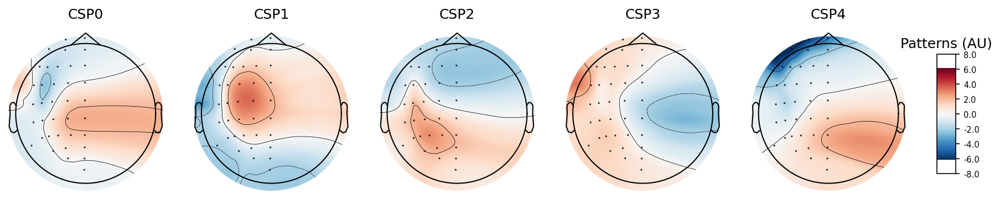

In [114]:
artificial_raw = raw_d.copy().pick_channels(get_channels(raw_g, "G"))
csp.plot_patterns(artificial_raw.copy().pick(picks="eeg").info, ch_type='eeg', units='Patterns (AU)', size=1.5);

In [116]:
# Obtenir les données transformées par la CSP
n_patient = 0
n_session = 1
csp_data = csp.transform(data_patients[n_patient][n_session])
labels = labels_patients[n_patient][n_session]

C:\Users\aurel\AppData\Local\Temp\ipykernel_22340\836421745.py:25: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


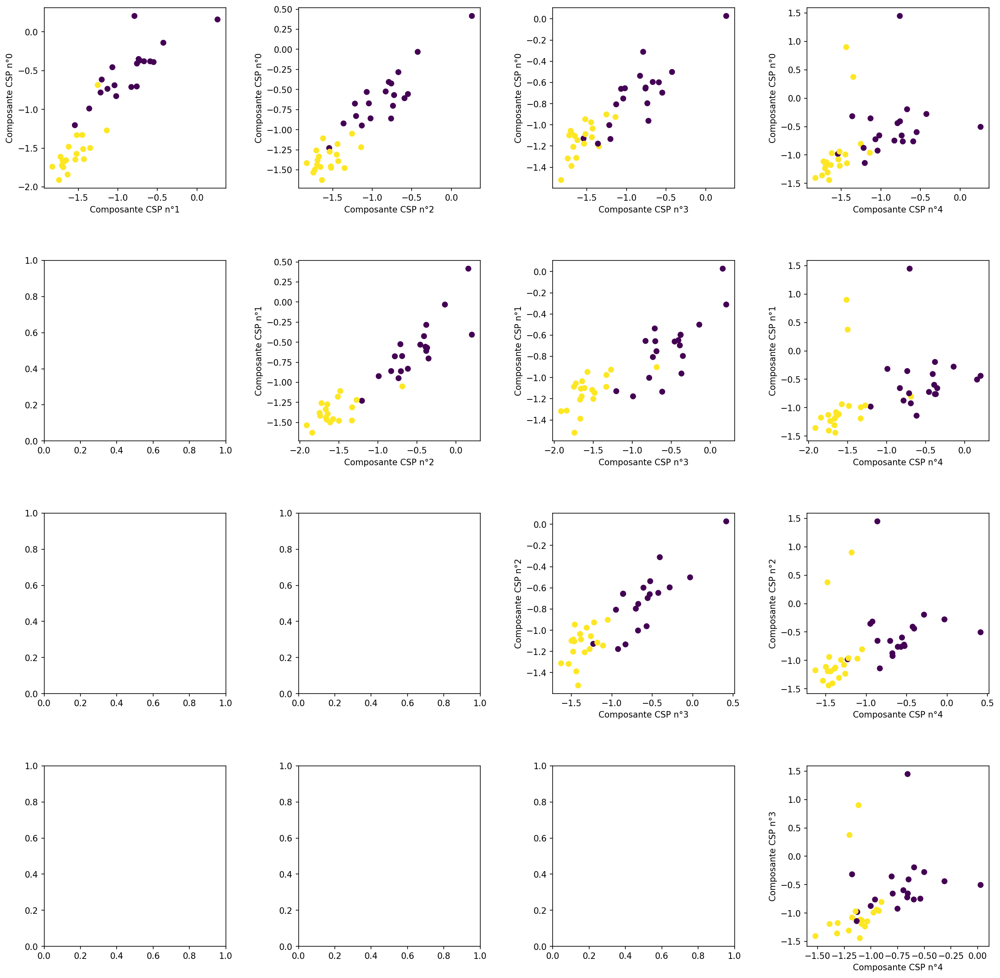

In [118]:
# Définir la taille de chaque vignette
figsize_per_subplot = 4  # Choisissez la taille appropriée en pouces

# Calculer la taille totale de la figure en fonction du nombre de sous-plots
figsize = (n_components * figsize_per_subplot, n_components * figsize_per_subplot)

# Créer une figure avec une grille spécifique
fig, axs = plt.subplots(n_components-1, n_components-1, figsize=figsize, gridspec_kw={'wspace': 0.4, 'hspace': 0.4})

for i in range(n_components):
    for j in range(i+1, n_components):
        # Sélectionner la première composante CSP
        csp_component_y = csp_data[:, i]

        # Sélectionner la dernière composante CSP
        csp_component_x = csp_data[:, j]

        # Faire un graphe avec la première composante en ordonnées et la dernière en abscisses
        ax = axs[i, j-1]  # Utilisation de la grille spécifique
        ax.scatter(csp_component_y, csp_component_x, c=labels, cmap='viridis')
        ax.set_xlabel(f'Composante CSP n°{j}')
        ax.set_ylabel(f'Composante CSP n°{i}')

# Ajuster automatiquement la disposition des sous-plots pour éviter le chevauchement
plt.tight_layout()

plt.show()

In [65]:

from sklearn.model_selection import KFold
cv = KFold(n_splits=N_SPLIT, shuffle=True, random_state=RANDOM_STATE)
split_folds = cv.split(data_patients)
scores = []
i = 0
for train_patient_idx, test_patient_idx in split_folds:
    train_data = np.concatenate([data_patients[i][j] for i in train_patient_idx for j in range(len(data_patients[i]))], axis=0)
    train_labels = np.concatenate([labels_patients[i][j] for i in train_patient_idx for j in range(len(data_patients[i]))], axis=0)
    test_data = np.concatenate([data_patients[i][j] for i in test_patient_idx for j in range(len(data_patients[i]))], axis=0)
    test_labels = np.concatenate([labels_patients[i][j] for i in test_patient_idx for j in range(len(data_patients[i]))], axis=0)

    # Shuffle train test
    train_idx = np.arange(len(train_data))
    np.random.RandomState(RANDOM_STATE+i).shuffle(train_idx)
    train_data = train_data[train_idx]
    train_labels = train_labels[train_idx]
    test_idx = np.arange(len(test_data))
    np.random.RandomState(RANDOM_STATE+i).shuffle(test_idx)
    test_data = test_data[test_idx]
    test_labels = test_labels[test_idx]
    i+=1

In [67]:
train_data.shape

(854, 37, 3073)

In [119]:
csp_all = mne.decoding.CSP(n_components=n_components)
csp_all.fit(test_data,test_labels); # On fit avec le 1er patient et la première session

csp_data = csp.transform(train_data)
labels = train_labels

C:\Users\aurel\AppData\Local\Temp\ipykernel_22340\2075081880.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


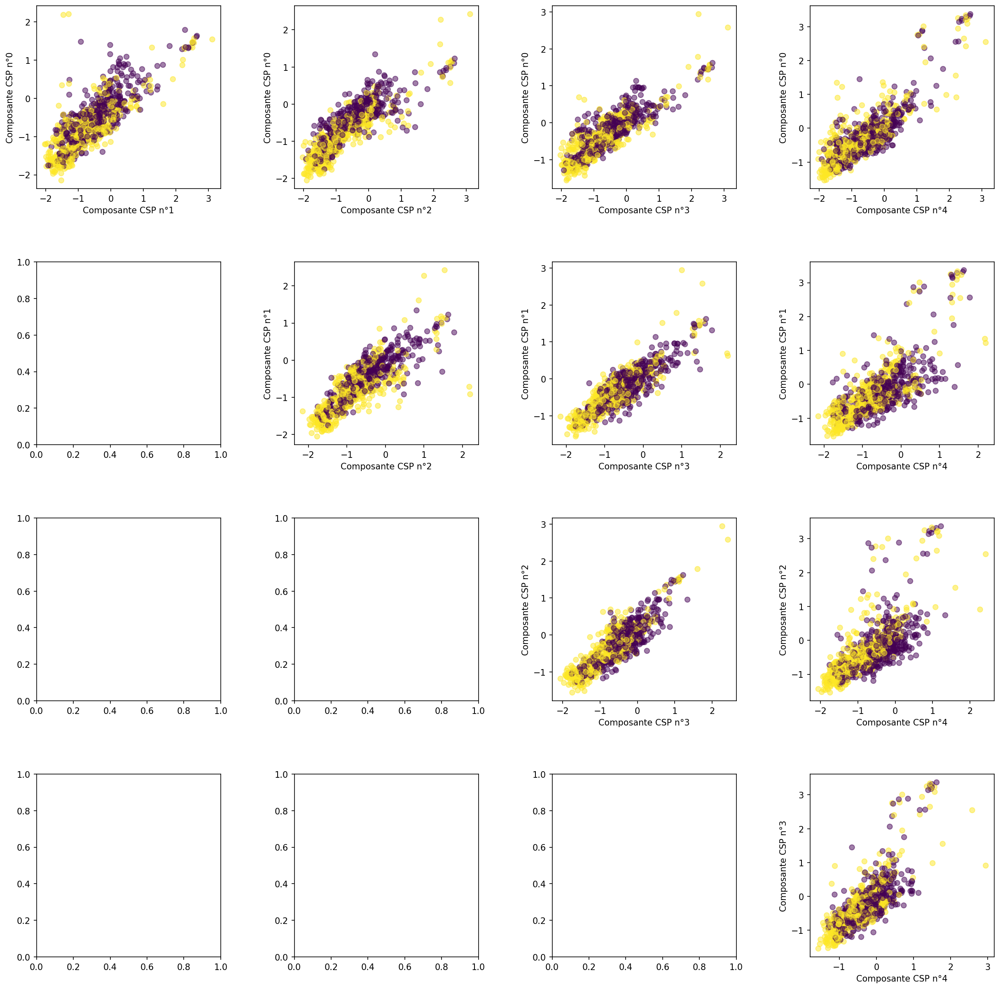

In [122]:
# Définir la taille de chaque vignette
figsize_per_subplot = 4  # Choisissez la taille appropriée en pouces

# Calculer la taille totale de la figure en fonction du nombre de sous-plots
figsize = (n_components * figsize_per_subplot, n_components * figsize_per_subplot)

# Créer une figure avec une grille spécifique

fig, axs = plt.subplots(n_components-1, n_components-1, figsize=figsize, gridspec_kw={'wspace': 0.4, 'hspace': 0.4})

for i in range(n_components):
    for j in range(i+1, n_components):
        # Sélectionner la première composante CSP
        csp_component_y = csp_data[:, i]

        # Sélectionner la dernière composante CSP
        csp_component_x = csp_data[:, j]

        # Faire un graphe avec la première composante en ordonnées et la dernière en abscisses
        ax = axs[i, j-1]  # Utilisation de la grille spécifique
        ax.scatter(csp_component_y, csp_component_x, c=labels, cmap='viridis', alpha = 0.5)
        ax.set_xlabel(f'Composante CSP n°{j}')
        ax.set_ylabel(f'Composante CSP n°{i}')

# Ajuster automatiquement la disposition des sous-plots pour éviter le chevauchement
plt.tight_layout()

plt.show()